In [1]:
import pandas as pd
import numpy as np
from glob import glob
from os import path
from scipy import stats
import pingouin as pg


import matplotlib.pyplot as plt
import seaborn as sns
from statannot import add_stat_annotation
from IPython.display import display

from dual_data_utils import make_clean_concat_data
from stopsignalmetrics import StopData, SSRTmodel, Violations, PostStopSlow
%matplotlib inline

/Users/henrymj/anaconda3/lib/python3.7/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.3.9, the latest is 0.3.10.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs
/Users/henrymj/anaconda3/lib/python3.7/site-packages/outdated/utils.py:18: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.0, the latest is 0.2.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs


In [2]:
# violation ploting imports
from cycler import cycler

from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri

pandas2ri.activate()
%load_ext rpy2.ipython

try:
    tidyverse = importr('tidyverse')
except:
    utils = importr('utils')
    utils.install_packages('tidyverse', repo="http://cran.rstudio.com/") 
    tidyverse = importr('tidyverse')
    
try:
    lme4 = importr('lme4')
except:
    utils = importr('utils')
    utils.install_packages('lme4', repo="http://cran.rstudio.com/")
    lme4 = importr('lme4')
    
try:
    lmerTest = importr('lmerTest')
except:
    utils = importr('utils')
    utils.install_packages('lmerTest', repo="http://cran.rstudio.com/") 
    lmerTest = importr('lmerTest')
    
try:
    emmeans = importr('emmeans')
except:
    utils = importr('utils')
    utils.install_packages('emmeans', repo="http://cran.rstudio.com/") 
    emmeans = importr('emmeans')
    
try:
    rstatix = importr('rstatix')
except:
    utils = importr('utils')
    utils.install_packages('rstatix', repo="http://cran.rstudio.com/") 
    rstatix = importr('rstatix')

# Read in and compute metrics on the data

In [3]:
OUTLIER_THRESH  = 3
SSD_THRESH = 200

dual_dict = {
    'stop_signal_with_cued_task_switching': {
        'dual_col': 'cue_task_switch',
        'DC': 'cue_stay_task_stay',
        'DE': 'cue_switch_task_switch',
        'OTHER': ['cue_switch_task_stay']
    },
    'stop_signal_with_directed_forgetting': {
        'dual_col': 'directed_forgetting_condition',
        'DC': 'con',
        'DE': 'neg',
        'OTHER': ['pos']
    },
    'stop_signal_with_flanker': {
        'dual_col': 'flanker_condition',
        'DC': 'congruent',
        'DE': 'incongruent'
    },
    'stop_signal_with_go_no_go': {
        'dual_col': 'go_nogo_condition',
        'DC': 'go',
        'DE': 'nogo'
    },
    'stop_signal_with_n_back': {
        'dual_col': 'delay_condition',
        'DC': 1.,
        'DE': 2.,
        'OTHER': [3.]
    },
    'stop_signal_with_predictable_task_switching': {
        'dual_col': 'predictable_condition',
        'DC': 'stay',
        'DE': 'switch'
    },
    'stop_signal_with_shape_matching': {
        'dual_col': 'shape_matching_condition',
        'DC': 'CONTROL',
        'DE': 'DISTRACTOR',
        'OTHER': ['DSD', 'SSS']
    },
}

stopmetrics_var_dict = {
    'columns': {
        'ID': 'worker_id',
        'block': 'current_block',
        'condition': 'SS_trial_type',
        'SSD': 'SS_delay',
        'goRT': 'rt',
        'stopRT': 'rt',
        'response': 'key_press',
        'correct_response': 'choice_correct_response',
        'choice_accuracy': 'choice_accuracy'},
    'key_codes': {
        'go': 'go',
        'stop': 'stop',
        'correct': 1,
        'incorrect': 0,
        'noResponse': -1}}

In [4]:
def get_query_str(col, condition):
    if type(condition)==str:
        return "%s=='%s'" % (col, condition)
    elif type(condition) in [float, int]:
        return "%s==%s" % (col, condition)
    elif type(condition)==list:
        return "%s in %s" % (col, condition)

def mean_pss(data_df, stop_type='all'):
    return PostStopSlow().fit_transform(
        data_df, stop_type=stop_type, level='group'
    ).groupby('pre_ID').apply(
        lambda x: (x[f'post_goRT'] - x[f'pre_goRT']
                  ).mean()
    )

def stop_summarize(data_df, thresh=SSD_THRESH):
    sum_df = SSRTmodel().fit_transform(data_df, level='group')
    sum_df_wThresh = SSRTmodel().fit_transform(data_df.query(f'SSD>{thresh} or condition=="go"'), level='group').add_suffix('_wThresh')
    sum_df = pd.concat([sum_df, sum_df_wThresh],
                       1,
                       sort=True
                      )

    for stop_type in ['all', 'fail', 'success']:
        sum_df = pd.concat(
            [sum_df, mean_pss(data_df, stop_type=stop_type).rename('PSS_%s' % stop_type),
            mean_pss(data_df.query(f'SSD>{thresh} or condition=="go"'), stop_type=stop_type).rename('PSS_%s_wThresh' % stop_type)],
            1,
            sort=True
        )
    return sum_df

In [5]:
stop_data_dict = make_clean_concat_data(stop_subset=True)

# build dict
ssrtc_out = {}
violation_out = {}
for task_name in stop_data_dict:
    curr_data = StopData(stopmetrics_var_dict).fit_transform(stop_data_dict[task_name].drop(columns=['correct_response']))
    short_name = task_name.split('_with_')[-1]
    sum_df = stop_summarize(curr_data)
    ssrtc_out[short_name] = sum_df
    violation_out[short_name] = Violations().fit_transform(curr_data, level='group')
    
    if 'with' in task_name:
        dual_col = dual_dict[task_name]['dual_col']
        for key in [k for k in dual_dict[task_name] if k!='dual_col']:
            ssrtc_out['%s_%s' % (short_name,key)] = stop_summarize(
                curr_data.query(get_query_str(dual_col, dual_dict[task_name][key]))
            )

ssrtc_out['SE'] = ssrtc_out.pop('stop_signal_single_task_network')
metrics = [c for c in ssrtc_out['SE'].columns if 'max_RT' not in c]

#flatten data, remove outliers
flattened_data = pd.concat([ssrtc_out[k].add_prefix(k+'_') for k in ssrtc_out], axis=1, sort=True)
flattened_data = flattened_data.filter(regex='SE|DC|DE|OTHER|PSS_all|PSS_fail|PSS_success', axis=1)
z_df = flattened_data.apply(stats.zscore).apply(np.abs)
flattened_data[z_df>OUTLIER_THRESH] = None
flattened_data.index.name='ID'

# group by metric across tasks
metric_dict = {met: flattened_data.loc[:, ~flattened_data.columns.str.contains("wThresh")].filter(regex=met).copy() for met in metrics if 'wThresh' not in met}
metric_dict.update({
    met: flattened_data.loc[:,flattened_data.columns.str.contains("wThresh")].filter(regex=met).copy() for met in metrics if 'wThresh' in met
})

#get basic description of SSRTs across tasks - the main result
ssrt_desc = metric_dict['SSRT'].describe()
print(ssrt_desc.loc['mean',:].round(3))
ssrt_desc

predictable_task_switching_DC_SSRT    238.576
predictable_task_switching_DE_SSRT    248.470
n_back_DC_SSRT                        256.845
n_back_DE_SSRT                        295.347
n_back_OTHER_SSRT                     277.396
flanker_DC_SSRT                       237.844
flanker_DE_SSRT                       238.531
shape_matching_DC_SSRT                268.333
shape_matching_DE_SSRT                269.429
shape_matching_OTHER_SSRT             264.727
cued_task_switching_DC_SSRT           263.672
cued_task_switching_DE_SSRT           269.516
cued_task_switching_OTHER_SSRT        263.250
directed_forgetting_DC_SSRT           336.545
directed_forgetting_DE_SSRT           339.955
directed_forgetting_OTHER_SSRT        305.758
SE_SSRT                               234.210
Name: mean, dtype: float64


/Users/henrymj/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd


,predictable_task_switching_DC_SSRT,predictable_task_switching_DE_SSRT,n_back_DC_SSRT,n_back_DE_SSRT,n_back_OTHER_SSRT,flanker_DC_SSRT,flanker_DE_SSRT,shape_matching_DC_SSRT,shape_matching_DE_SSRT,shape_matching_OTHER_SSRT,cued_task_switching_DC_SSRT,cued_task_switching_DE_SSRT,cued_task_switching_OTHER_SSRT,directed_forgetting_DC_SSRT,directed_forgetting_DE_SSRT,directed_forgetting_OTHER_SSRT,SE_SSRT
count,33.000000,33.000000,33.000000,33.000000,32.000000,32.000000,32.000000,33.000000,33.000000,33.000000,32.000000,32.000000,32.000000,33.000000,33.000000,33.000000,33.000000
mean,238.575758,248.469697,256.844890,295.347344,277.395833,237.843750,238.531250,268.333333,269.429293,264.727273,263.671875,269.515625,263.250000,336.545455,339.954545,305.757576,234.209596
std,46.989879,55.446334,57.919530,77.217794,53.533190,44.473159,41.609153,60.950244,60.832064,57.992603,68.633977,66.101887,63.909967,83.103415,81.259554,47.711924,45.014803
min,156.000000,155.500000,126.419355,184.666667,179.000000,143.000000,169.000000,144.000000,149.666667,137.000000,142.000000,119.500000,143.500000,168.000000,195.000000,206.000000,109.166667
25%,205.500000,216.000000,224.709677,247.000000,230.833333,220.500000,213.250000,216.500000,224.333333,228.000000,231.250000,232.000000,214.875000,285.500000,291.500000,266.500000,199.000000
50%,247.500000,235.500000,259.129032,282.666667,272.833333,240.750000,232.750000,264.000000,262.500000,253.500000,260.250000,280.250000,258.500000,325.500000,324.500000,310.750000,239.833333
75%,262.500000,291.000000,292.875000,330.064516,307.333333,264.875000,277.500000,307.000000,310.000000,291.000000,305.250000,290.875000,299.750000,387.500000,384.500000,338.000000,264.583333
max,330.000000,384.000000,375.387097,501.333333,390.000000,324.500000,327.000000,432.500000,414.000000,393.500000,409.500000,423.000000,439.500000,488.000000,566.000000,397.000000,347.583333


# Violation Plotting

In [6]:
# create line style cycle
colorset=['c','g','b','y','r','m', '#ff7f0e']
linestyleset=['-', '--', ':', '-.']

linecolors=[]
linestyles=[]      
for color in colorset:
    for style in linestyleset:
        linecolors.append(color)
        linestyles.append(style)

In [7]:
alldata = None
violation_by_SSD_perCondition = None
for key in violation_out:
    va_df = violation_out[key]
    # generate alldata for lme
    piv_df = va_df.pivot(index='SSD', columns='ID', values='mean_violation') # pivot to introduce nans
    data_long = pd.melt(piv_df.reset_index(), id_vars='SSD', value_vars = piv_df.columns, #pivot back into long format
                        var_name ='ID', value_name='violation')
    data_long['study'] = key
    if alldata is None:
        alldata = data_long
    else:
        alldata = pd.concat((alldata, data_long))
    # get mean violation per ssd per condition
    curr_violation_series = va_df.groupby('SSD').mean()['mean_violation'] #get the mean violation per SSD across subjects as a pd Series
    curr_violation_series.name = key #name the series after the condition
    if violation_by_SSD_perCondition is None: #create or add the series to a full DF
        violation_by_SSD_perCondition = curr_violation_series
    else:
        violation_by_SSD_perCondition = pd.concat([violation_by_SSD_perCondition,
                                                   curr_violation_series], axis=1)
        
print('%s unique subjects originally' % len(alldata.ID.unique()))
alldata = alldata.query("ID in %s" % alldata.groupby('ID').apply(lambda x: len(x[x.violation.notnull()]) > 2).index.tolist())
print('%s unique subjects w/ >2 violations' % len(alldata.ID.unique()))


33 unique subjects originally
33 unique subjects w/ >2 violations


In [8]:
%%R -i alldata -o ci

alldata$SSD_factor = as.factor(alldata$SSD)
lmer.result <- lmer(violation ~ SSD_factor + (1|ID) + (1|study), data=alldata)
em = emmeans(lmer.result, specs='SSD_factor')
ci = confint(em, adjust='mvt')
ci$SSD = as.numeric(levels(ci$SSD_factor))[ci$SSD_factor]
em

 SSD_factor emmean   SE  df lower.CL upper.CL
 0           15.88 30.9 581    -44.8     76.6
 50          13.44 33.5 657    -52.2     79.1
 100         15.64 28.1 464    -39.6     70.9
 150         -1.79 25.4 365    -51.7     48.1
 200         -1.03 16.6 422    -33.6     31.5
 250        -48.32 13.1 272    -74.2    -22.4
 300        -69.98 11.4 187    -92.5    -47.5
 350        -57.93 10.6 151    -78.8    -37.1
 400        -51.68 10.5 152    -72.4    -31.0
 450        -51.97 10.0 126    -71.8    -32.1
 500        -61.35 10.5 148    -82.2    -40.5
 550        -56.28 11.5 195    -79.0    -33.6
 600        -67.23 12.4 235    -91.7    -42.7
 650        -42.21 15.1 401    -71.9    -12.5
 700        -94.45 18.7 597   -131.2    -57.7
 750        -98.23 26.7 876   -150.6    -45.9

Degrees-of-freedom method: kenward-roger 
Confidence level used: 0.95 


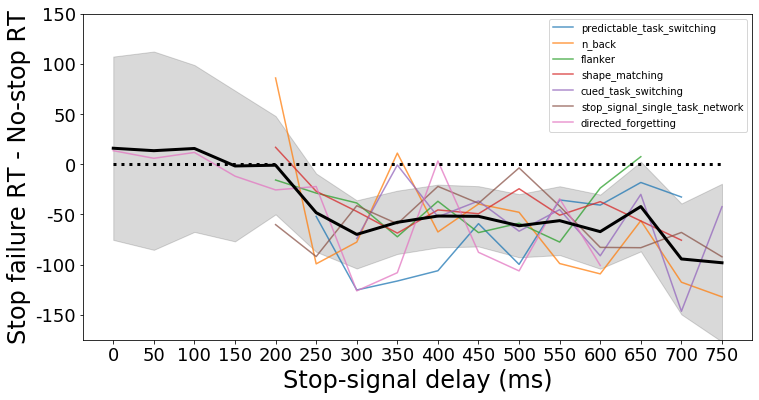

In [9]:
plt.figure(figsize=(12,6))
_ = plt.plot(violation_by_SSD_perCondition, alpha=0.75)
plt.plot(ci['SSD_factor'].astype(int), ci.emmean,linewidth=3, #plot mean
             linestyle='solid' ,color='k')
plt.fill_between(ci['SSD_factor'].astype(int), ci['lower.CL'], ci['upper.CL'], color='k', alpha=0.15) #plot 95% CI
plt.plot([0,750],[0,0],color='k',linestyle=':',linewidth=3)
plt.xlabel('Stop-signal delay (ms)',fontsize=24)
plt.ylabel('Stop failure RT - No-stop RT',fontsize=24)
ax=plt.gca()
xticks=np.arange(0,800,50)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks,fontsize=18)
yticks=np.arange(-200,200,50)
ax.set_yticks(yticks)
ax.set_yticklabels(yticks,fontsize=18)
ax.set_ylim([-175, 150])
ax.legend(violation_by_SSD_perCondition.columns)
plt.show()
_ = plt.close()

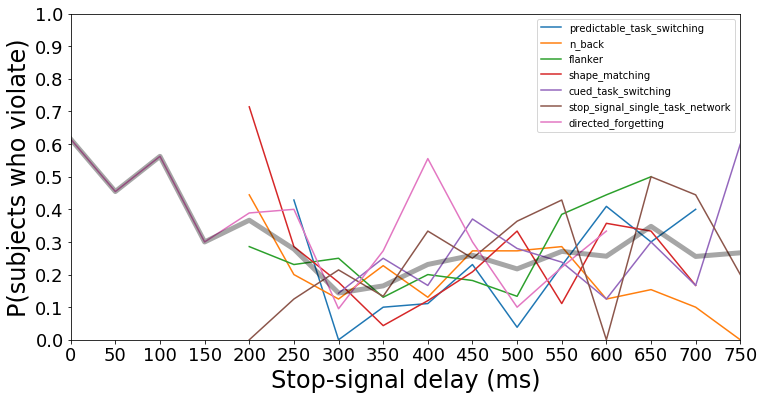

In [10]:
proportionSubjectsViolating_per_SSD = pd.DataFrame()
for key in violation_out:
    curr_df = violation_out[key]

    curr_df['violation_count'] = 0
    curr_df.loc[curr_df['mean_violation']>0, 'violation_count'] = 1
    violations_per_SSD = curr_df.groupby('SSD').sum()['violation_count']
    num_subjs_per_SSD = curr_df.groupby('SSD').count()['ID']
    prop_violations  = violations_per_SSD / num_subjs_per_SSD
    prop_violations.name = key #name the series after the condition
    proportionSubjectsViolating_per_SSD = pd.concat([proportionSubjectsViolating_per_SSD,
                                                   prop_violations], axis=1)
# plot 
plt.figure(figsize=(12,6))
plt.plot(proportionSubjectsViolating_per_SSD)
plt.plot(proportionSubjectsViolating_per_SSD.mean(1),linewidth=5,color='k',alpha=.35, linestyle='solid')
plt.axis([0,750,0,1])
plt.xlabel('Stop-signal delay (ms)',fontsize=24)
plt.ylabel('P(subjects who violate)',fontsize=24)
ax=plt.gca()
xticks=np.arange(0,800,50)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks,fontsize=18)
yticks=np.arange(0,1.1,0.1)
ax.set_yticks(yticks)
ax.set_yticklabels(['%0.1f'%i for i in yticks],fontsize=18)
ax.legend(proportionSubjectsViolating_per_SSD.columns)
plt.show()
_ = plt.close()

# stopsignalmetrics Plotting

In [11]:
sns.set(style="whitegrid", palette="colorblind", color_codes=True)
palette ={"DC":"C0", "DE":"C1", "SE":"C2", "POS/3BACK/DSD|SSS/CUE_SWITCH":"C3", "COMBINE":"C5"}
order_dict = {
    'SE': 'aa',
    'go_no_go': 'ab',
    'predictable_task_switching': 'ba',
    'cued_task_switching': 'bb',
    'flanker': 'ca',
    'shape_matching': 'cb',
    'n_back': 'da',
    'directed_forgetting': 'db'
}

In [12]:
def context_str(string):
    if 'DC' in string:
        return 'DC'
    elif 'DE' in string:
        return 'DE'
    elif 'SE' in string:
        return 'SE'
    elif 'OTHER' in string:
        return 'POS/3BACK/DSD|SSS/CUE_SWITCH'
    else:
        return 'COMBINE'
    
def drop_from_metrics(met_df, drop_other=False, dropna=False):
    if drop_other:
        met_df = met_df[met_df.columns.drop(list(met_df.filter(regex='OTHER|go_no_go')))]
    if dropna:
        drop_num = met_df.isna().any(axis=1).sum()
        print(f'dropping {drop_num}')
        met_df = met_df.dropna(0)
    return met_df

def load_simple_metric_df(metric, drop_SE=True, drop_other=True, dropna=True):
    metric_df = drop_from_metrics(metric_dict[metric].copy(), drop_other=drop_other, dropna=dropna)
    if drop_SE: del metric_df[f'SE_{metric}']
    metric_df.columns = [col.replace(f'_{metric}', '') for col in metric_df.columns]
    return metric_df

def clean_melt_names(melt_df, metric):
    melt_df['task'] = [i.replace(f'_{metric}', '').replace('_DC', '').replace('_DE', '').replace('_OTHER', '') for i in melt_df['variable']]
    melt_df['context'] = [context_str(i) for i in melt_df['variable']]
    melt_df.loc[melt_df['task']=='SE', 'context'] = 'SE'
    melt_df[metric] = melt_df['value']
    return melt_df

def sort_melt(melt_df, method='construct'):
    if method == 'construct':
        melt_df['order'] = melt_df['task'].map(order_dict)
        melt_df = melt_df.sort_values(['order', 'context'])
    else:
        medians = melt_df.groupby('task').median()['value']
        melt_df['median'] = melt_df['task'].map(dict(medians))
        melt_df = melt_df.sort_values(['median', 'context'])
    return melt_df

def get_dc_de_sub_dfs(diff_df):
    DC_df = diff_df.filter(regex='DC')
    DC_df.columns = DC_df.columns.str.replace('_DC','')

    DE_df = diff_df.filter(regex='DE')
    DE_df.columns = DE_df.columns.str.replace('_DE','')
    
    DE_minus_DC_df = DE_df.sub(DC_df)
    return DC_df, DE_df, DE_minus_DC_df

# Correlating PSS with SSRT

1. correlating a dual task's PSS with the difference in SSRT between DE and DC conditions in the same dual task
2. correlating change in PSS b/w the dual task and SE with the change in SSRT b/w dual task and SE, separately for DE and DC conditions
3. correlating SE PSS with with the change in SSRT b/w dual task and SE, separately for DE and DC conditions

dropping 2
dropping 5
dropping 2
dropping 6
dropping 8
dropping 5
dropping 8
dropping 6


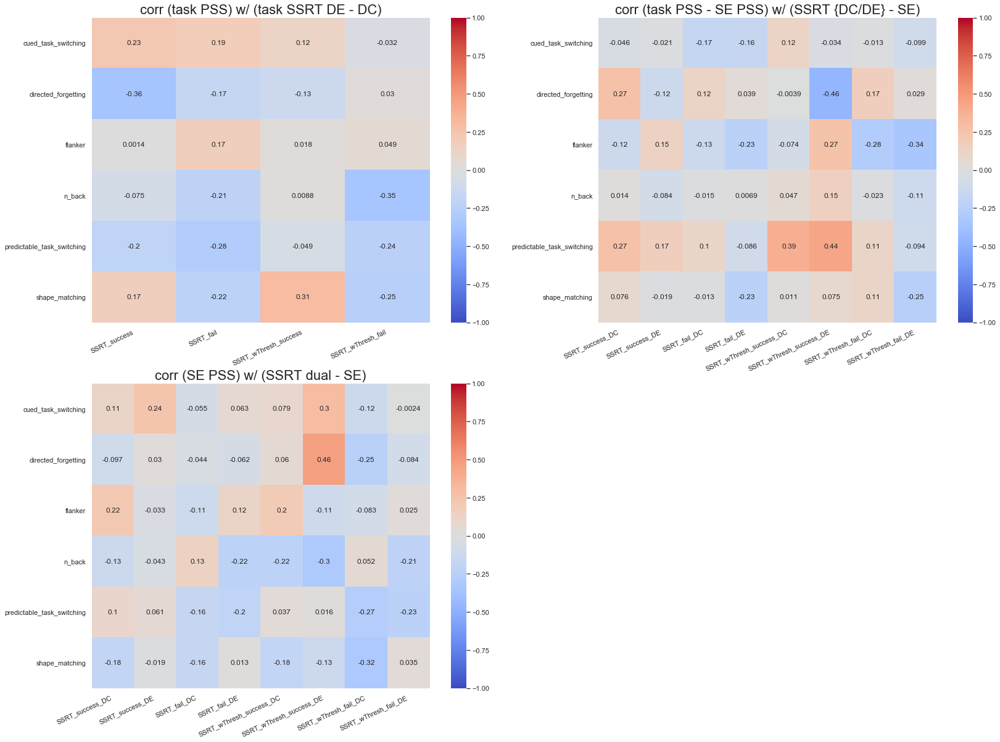

In [13]:
corr_pss_wDEsubDC_df = pd.DataFrame(index=['cued_task_switching', 'directed_forgetting', 'flanker', 'n_back',
       'predictable_task_switching', 'shape_matching'])

corr_pssDsubSE_wDsubSE_df = pd.DataFrame(index=['cued_task_switching', 'directed_forgetting', 'flanker', 'n_back',
       'predictable_task_switching', 'shape_matching'])

corr_pssSE_wDsubSE_df = pd.DataFrame(index=['cued_task_switching', 'directed_forgetting', 'flanker', 'n_back',
       'predictable_task_switching', 'shape_matching'])

for SSRT_method in ['SSRT', 'SSRT_wThresh']:
    for pss in ['success', 'fail']:
        SSRT_df = load_simple_metric_df(f'{SSRT_method}', drop_SE=False)
        pss_df = load_simple_metric_df(f'PSS_{pss}', drop_SE=False)
        pss_df = pss_df[pss_df.columns.drop(list(pss_df.filter(regex='DC|DE')))]
        shared_subs = list(set(pss_df.index).intersection(set(SSRT_df.index)))
        SSRT_df = SSRT_df.loc[shared_subs, :].copy()
        pss_df = pss_df.loc[shared_subs, :].copy()
        DC_df, DE_df, DE_sub_DC_df = get_dc_de_sub_dfs(SSRT_df)
        corr_pss_wDEsubDC_df.loc[:, f'{SSRT_method}_{pss}'] =  pss_df.corrwith(DE_sub_DC_df)
        for dual_type, dual_SSRT_df in zip(['DC', 'DE'], [DC_df, DE_df]):            
            SSRT_dual_minus_SE_df = dual_SSRT_df.sub(SSRT_df.SE,axis='index')
            PSS_dual_minus_SE_df = pss_df.sub(pss_df.SE,axis='index')
            
            corr_pssSE_wDsubSE_df.loc[:, f'{SSRT_method}_{pss}_{dual_type}'] = SSRT_dual_minus_SE_df.corrwith(pss_df.SE)
            
            del PSS_dual_minus_SE_df['SE']
            corr_pssDsubSE_wDsubSE_df.loc[:, f'{SSRT_method}_{pss}_{dual_type}'] = PSS_dual_minus_SE_df.corrwith(SSRT_dual_minus_SE_df)
            
            
            
# plot heatmaps of corrs
fig, axes = plt.subplots(2, 2, figsize=(27,20))
ax = sns.heatmap(corr_pss_wDEsubDC_df.astype(float), annot=True, cmap='coolwarm', center=0, vmax=1, vmin=-1, ax=axes[0,0])
ax.set_title('corr (task PSS) w/ (task SSRT DE - DC)', fontsize=22)
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')

ax = sns.heatmap(corr_pssDsubSE_wDsubSE_df.astype(float), annot=True, cmap='coolwarm', center=0, vmax=1, vmin=-1, ax=axes[0,1])
ax.set_title('corr (task PSS - SE PSS) w/ (SSRT {DC/DE} - SE)', fontsize=22)
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')

ax = sns.heatmap(corr_pssSE_wDsubSE_df.astype(float), annot=True, cmap='coolwarm', center=0, vmax=1, vmin=-1, ax=axes[1,0])
ax.set_title('corr (SE PSS) w/ (SSRT dual - SE)', fontsize=22)
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')

fig.delaxes(axes[1,1])
plt.show()
plt.close()

# Main plots: t-tests, barplots, anovas, and violin plots looking at changes in some stopsignal metric when going from SE to a dual task condition

In [14]:
def t_tests(diff_df, metric):
    # setup
    DC_df, DE_df, DE_minus_DC_df = get_dc_de_sub_dfs(diff_df)
    
    task_df = pd.concat([DC_df, DE_df]).groupby(level=0).mean()
    
    
    ful_indices = ['DC>0', 'DE>0', 'DE>DC'] +\
                  ['%s>0' % c.replace('_%s' % metric, '') for c in task_df.columns] +\
                  ['%s>0' % c.replace('_%s' % metric, '') for c in diff_df.columns] +\
                  ['%s: DE>DC' % c.replace('_%s' % metric, '') for c in DE_minus_DC_df.columns]
    res_df = pd.DataFrame(index=ful_indices, columns=['t', 'p'])
    # DC and DE vs 0 and DE > DC
    res_df.loc['DC>0', ['t', 'p']] = stats.ttest_1samp(DC_df.mean(1), 0)
    res_df.loc['DE>0', ['t', 'p']] = stats.ttest_1samp(DE_df.mean(1), 0)
    res_df.loc['DE>DC', ['t', 'p']] = stats.ttest_rel(DE_df.mean(1), DC_df.mean(1))
    # task > 0
    for col in task_df.columns:
        res_df.loc['%s>0' % col.replace('_%s' % metric, ''), ['t', 'p']] = stats.ttest_1samp(task_df[col], 0)
    # task_{DE/DC} > 0
    for col in diff_df.columns:
        res_df.loc['%s>0' % col.replace('_%s' % metric, ''), ['t', 'p']] = stats.ttest_1samp(diff_df[col], 0)
    # task_DE > task_DC
    for col in DE_minus_DC_df.columns:
        res_df.loc['%s: DE>DC' % col.replace('_%s' % metric, ''), ['t', 'p']] = stats.ttest_1samp(DE_minus_DC_df[col], 0)
        t,p = stats.ttest_1samp(DE_minus_DC_df[col], 0)
    display(res_df.T)
    
    
def diff_plot(metric_dict, metric, sort=True, sort_method='construct', drop_other=True, dropna=True):
    met_df = drop_from_metrics(metric_dict[metric].copy(), drop_other=drop_other, dropna=dropna)
    if len(met_df)==0:
        return None

    diff_df = met_df.subtract(met_df[f'SE_{metric}'],0)
    del diff_df[f'SE_{metric}']
    t_tests(diff_df, metric)
    diff_melt = clean_melt_names(diff_df.reset_index().melt(id_vars='ID'), metric)
    diff_melt = sort_melt(diff_melt, method=sort_method) if sort else met_melt

    # barplot
    x='task'
    y=metric
    hue='context'
    fig = plt.figure(figsize=(14,6))
    ax = sns.barplot(x=x, y=y, hue=hue, data=diff_melt, palette=palette)
    _ = plt.xticks(rotation=30, ha='right')
    lowx, highx = plt.xlim()
    plt.plot([lowx, highx],[0,0],color='k',linestyle=':',linewidth=2)
    plt.title(metric)
    plt.tight_layout()
    lowy, highy = plt.ylim()
    _ = plt.axis([lowx, highx, lowy, highy])
    plt.show()
    plt.close()
    # anova 
    diff_melt = diff_melt[diff_melt.task!='go_no_go']
    aov_res = pg.rm_anova(data=diff_melt, dv='value', within=['task','context'], subject='ID', correction='auto', effsize='n2')
    display(aov_res)

def violin_metric(metric_dict, metric, sort=True, sort_method='construct', drop_other=True, dropna=True):
    met_df = drop_from_metrics(metric_dict[metric].copy(), drop_other=drop_other, dropna=dropna)
    if len(met_df)==0:
        return None
    met_melt = clean_melt_names(met_df.melt(), metric)
    met_melt = sort_melt(met_melt, method=sort_method) if sort else met_melt
    SE_median = met_melt.groupby('task').median().loc['SE',].value

    plt.figure(figsize=(18,8))
    x='task'
    y=metric
    hue='context'
    ax = sns.violinplot(x=x, y=y, hue=hue, data=met_melt, cut=0, palette=palette)
    _ = plt.xticks(rotation=30, ha='right')
    lowx, highx = plt.xlim()
    plt.plot([lowx, highx],[SE_median,SE_median],color='k',linestyle=':',linewidth=2)
    plt.title(metric)
    plt.tight_layout()
    lowy, highy = plt.ylim()
    _ = plt.axis([lowx, highx, lowy, highy])
    return met_melt

def p_t_plots(met_melt):
    if met_melt is None:
        return None
    varset = met_melt.variable.unique()
    p_df = pd.DataFrame(columns=varset, index=varset)
    t_df = pd.DataFrame(columns=varset, index=varset)

    for var1 in varset:
        var1_values = met_melt[met_melt.variable==var1].value.values
        for var2 in [v for v in varset if v!=var1]:
            var2_values = met_melt[met_melt.variable==var2].value.values
            t,p = stats.ttest_rel(var1_values, var2_values, nan_policy='omit')
            if type(p)!=np.float64:
                p=None
                t=None
            t_df.loc[var1,var2] = t
            p_df.loc[var1,var2] = p
    
    fig, axes = plt.subplots(1,2, figsize=(27,9))
    ax = sns.heatmap(t_df.fillna(0), annot=True, cmap='coolwarm', center=0, ax=axes[0])
    ax.set_title('T-values')
    ax = sns.heatmap(p_df.fillna(1), annot=True, cmap='coolwarm_r', vmin=0, center=.05, vmax=.05, ax=axes[1])
    ax.set_title('P-values')
    plt.show()
    plt.close()

In [15]:
pd.set_option("display.max_columns", None)

## First SSRT, the star of the show

dropping 2


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,4.451247,5.055144,2.273687,0.672388,4.136191,1.075575,3.2283,2.917012,7.895319,0.225635,1.043706,2.406884,4.210888,0.946787,0.93838,3.101051,3.066667,2.284787,3.012653,6.934794,7.247014,1.008041,2.65422,0.016025,0.337884,0.697652,0.479291
p,0.000109,0.00002,0.030307,0.506483,0.000262,0.290692,0.00301,0.006634,0.0,0.823015,0.304959,0.022451,0.000213,0.351311,0.355543,0.004173,0.004555,0.029568,0.005221,0.0,0.0,0.321497,0.012594,0.987321,0.737804,0.490767,0.635207


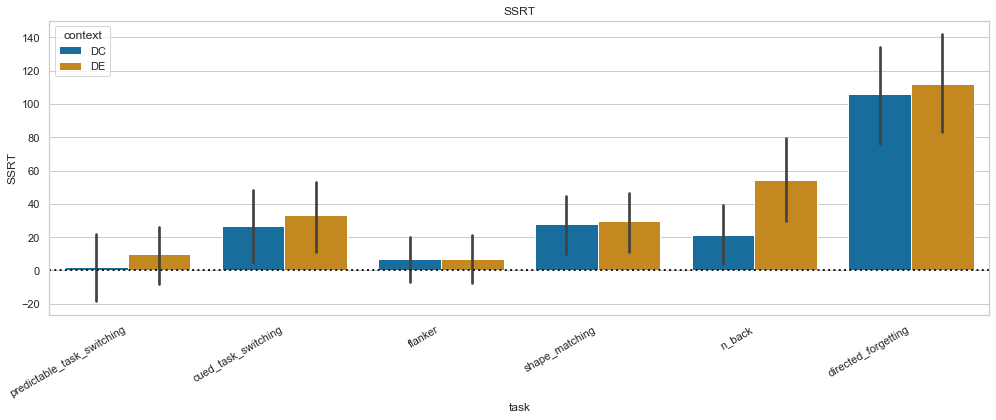

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,443357.053824,5,150,88671.410765,28.149391,4.779823e-20,9.587882e-15,0.370102,0.701728
1,context,8006.934311,1,30,8006.934311,5.169653,3.030657e-02,3.030657e-02,0.006684,1.000000
2,task * context,11105.536691,5,150,2221.107338,1.538927,1.810643e-01,2.002233e-01,0.009271,0.732053


dropping 2


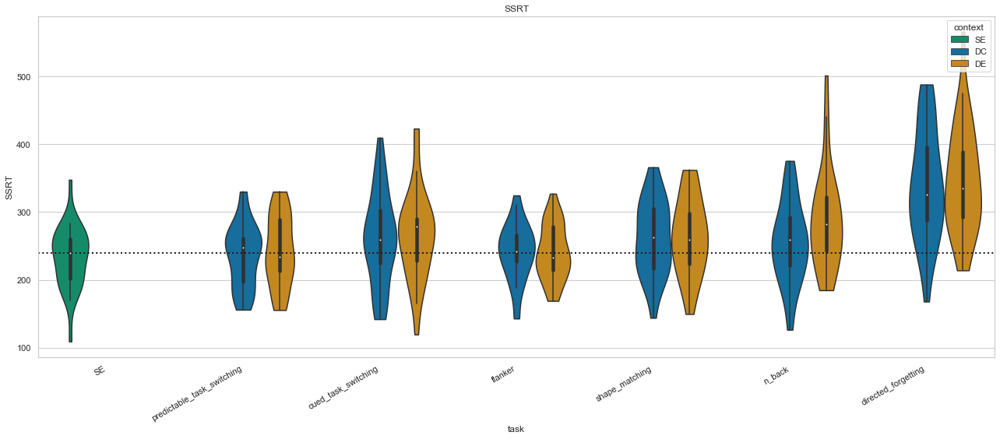

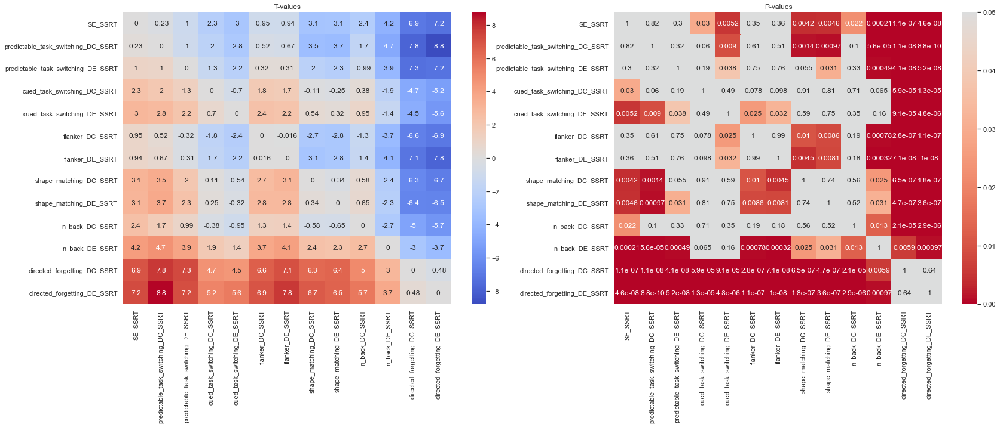

In [16]:
diff_plot(metric_dict, 'SSRT')
met_melt = violin_metric(metric_dict, 'SSRT')
p_t_plots(met_melt)

# Now all other metrics

dropping 2


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,-0.9759,-0.596449,2.959881,1.667664,0.364107,-1.541011,-0.283049,1.949616,-5.712971,1.089088,2.200284,0.960934,-0.329162,-1.965297,-1.11141,-0.843385,0.298492,1.729132,2.143305,-5.607074,-5.792561,3.651065,-2.586914,4.611749,5.178082,2.353833,-0.562103
p,0.336918,0.55535,0.005961,0.105789,0.718332,0.133797,0.779083,0.060624,0.000003,0.284787,0.035626,0.344267,0.74432,0.058698,0.27522,0.405688,0.767386,0.094065,0.040317,0.000004,0.000002,0.000986,0.014778,0.00007,0.000014,0.025326,0.578222


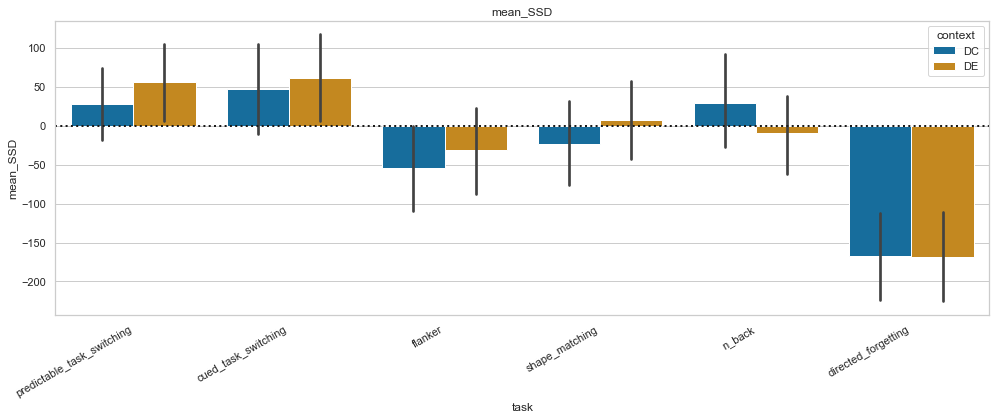

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,2.027898e+06,5,150,405579.571013,29.558191,8.231396e-21,4.401061e-16,0.468702,0.744764
1,context,7.952536e+03,1,30,7952.535633,8.760894,5.960709e-03,5.960709e-03,0.001838,1.000000
2,task * context,5.285454e+04,5,150,10570.908510,10.399034,1.400881e-08,3.591735e-05,0.012216,0.484476


dropping 2


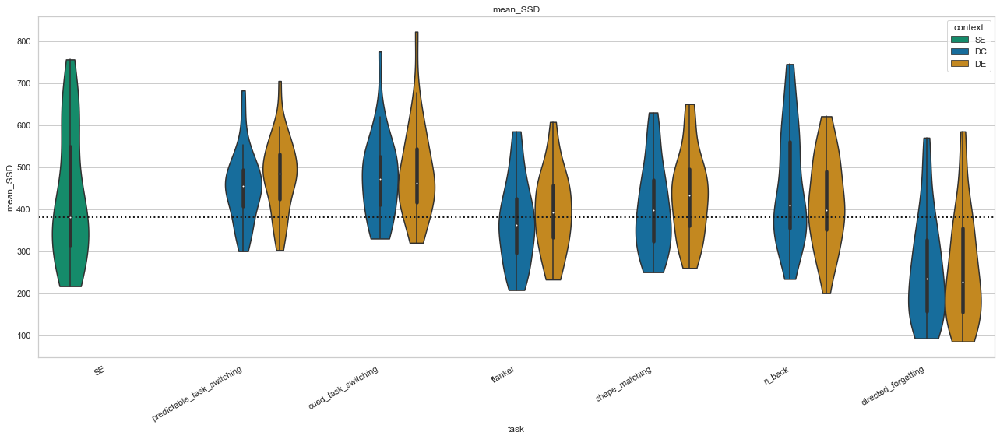

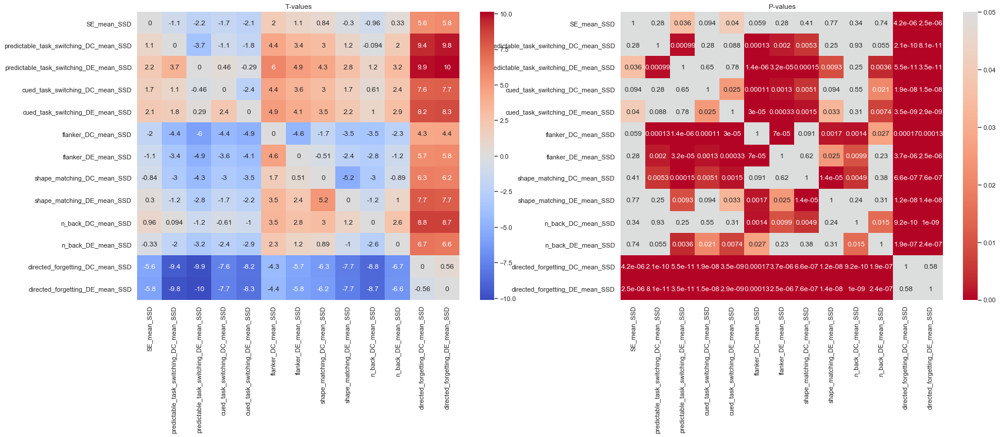

dropping 2


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,2.191561,-0.25883,-2.242058,0.448243,-2.364186,-0.781931,0.289621,0.61865,2.675531,0.903334,-0.017307,0.237409,-4.156127,-0.13249,-1.306198,-0.15517,0.704085,0.833361,-0.114939,3.084048,0.986315,-1.215287,-2.630854,-1.380569,1.15616,-0.954625,-1.169866
p,0.036311,0.797534,0.032504,0.657199,0.02474,0.440383,0.774099,0.540817,0.011968,0.373545,0.986307,0.813954,0.000248,0.895482,0.201412,0.877726,0.48681,0.411227,0.90926,0.004358,0.331867,0.233735,0.013316,0.177612,0.25674,0.347397,0.251266


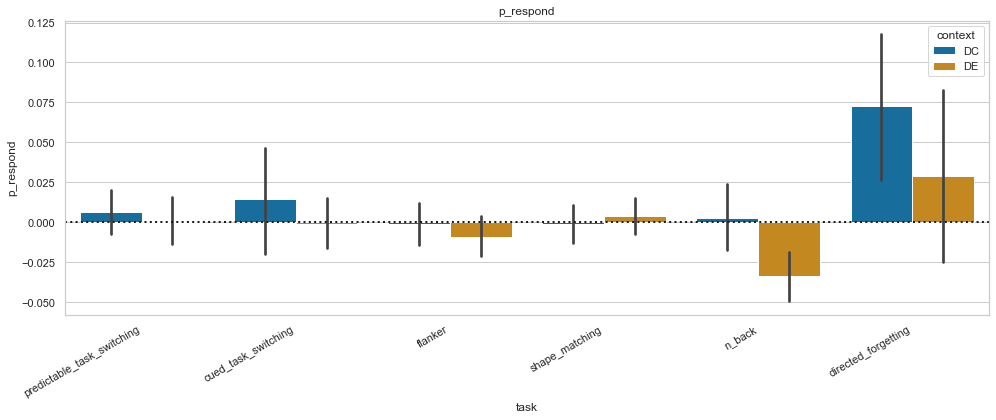

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.161625,5,150,0.032325,6.041710,0.000040,0.003562,0.084580,0.416900
1,context,0.028298,1,30,0.028298,5.026825,0.032504,0.032504,0.014809,1.000000
2,task * context,0.027311,5,150,0.005462,1.134407,0.344678,0.323706,0.014292,0.352778


dropping 2


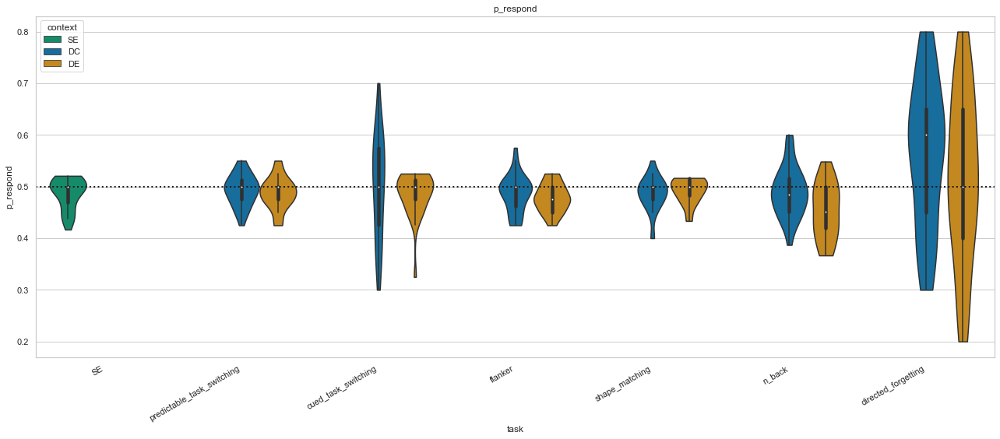

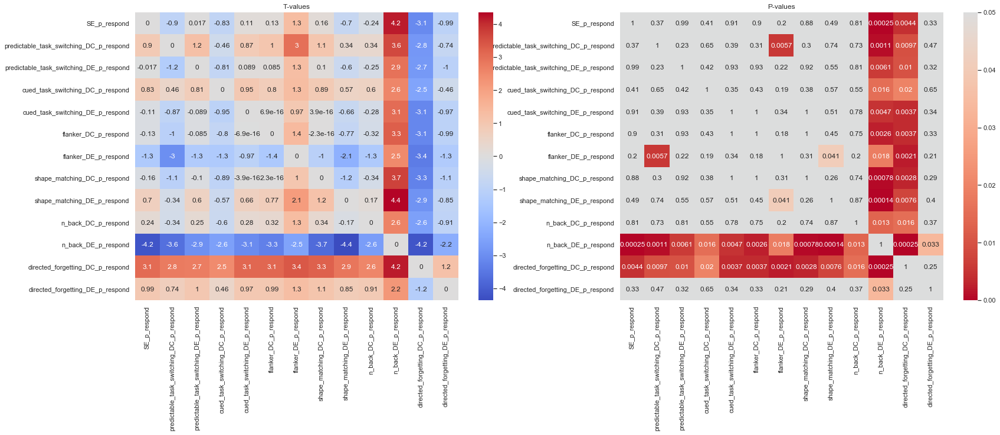

dropping 1


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,0.83997,1.95715,6.695497,2.63815,2.491326,-0.986262,1.424587,3.795227,-1.885992,1.792329,3.396063,2.070862,2.84957,-1.36394,-0.598086,0.865491,1.970457,3.231787,4.324594,-2.295024,-1.465724,5.232176,1.428521,5.619996,5.565897,3.264901,3.589997
p,0.407357,0.059387,0.0,0.01292,0.018287,0.33164,0.164267,0.000643,0.068696,0.082846,0.001891,0.046785,0.007713,0.182409,0.554128,0.393418,0.057773,0.002913,0.000147,0.028661,0.152794,0.000011,0.163141,0.000004,0.000004,0.002672,0.001125


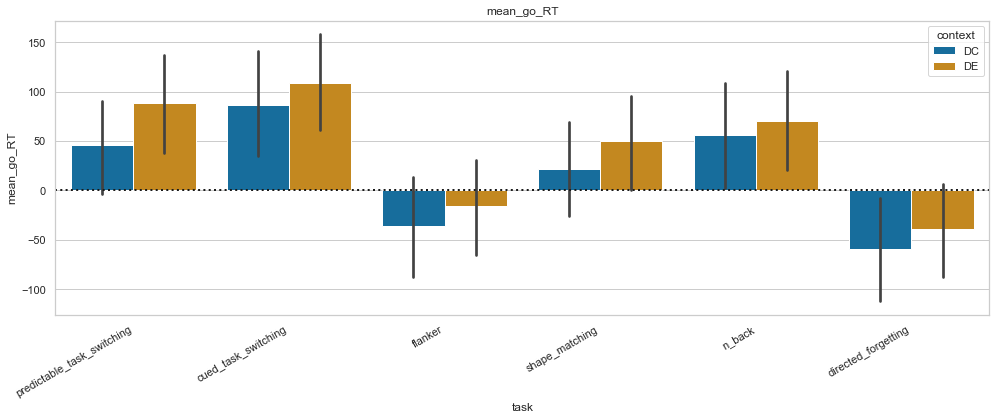

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,1.050954e+06,5,155,210190.894422,17.816789,6.235876e-14,1.341474e-11,0.339882,0.801612
1,context,5.935799e+04,1,31,59357.990697,44.829675,1.725045e-07,1.725045e-07,0.019197,1.000000
2,task * context,7.816834e+03,5,155,1563.366819,2.322263,4.566997e-02,6.285400e-02,0.002528,0.771460


dropping 1


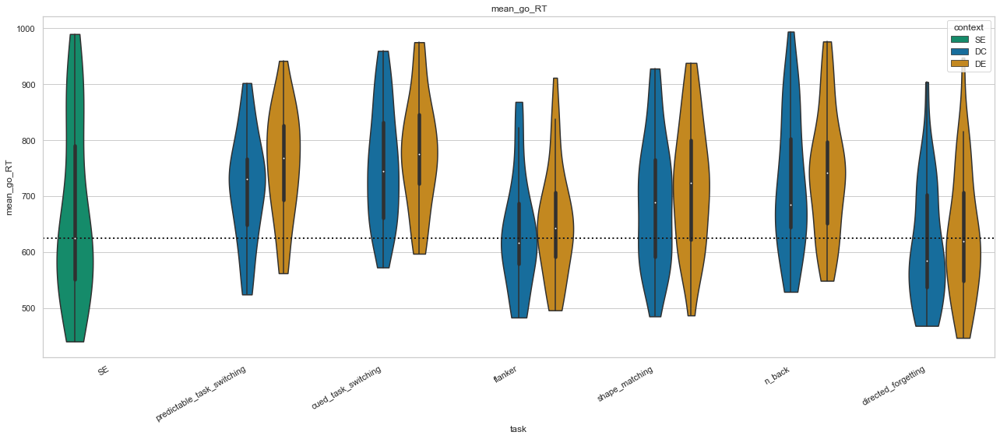

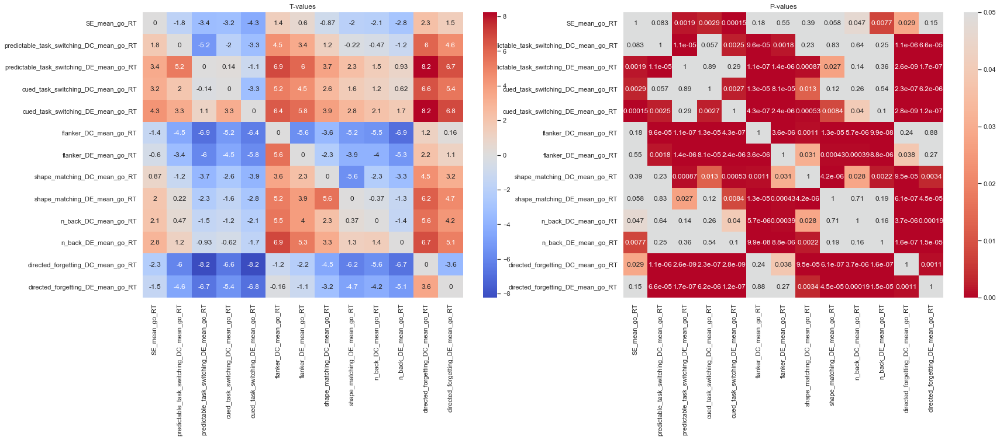

dropping 3


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,2.247822,3.907197,4.184715,3.464551,4.844743,-0.004705,0.219885,3.236585,2.980665,2.388725,3.975621,3.227037,5.790881,0.236681,-0.255649,-0.016211,0.471393,2.954205,3.075193,1.546854,3.937848,3.533419,2.296698,-0.973311,0.795609,-0.000553,2.615176
p,0.032361,0.000514,0.000242,0.001673,0.000039,0.996278,0.827501,0.003022,0.005771,0.023635,0.000427,0.003097,0.000003,0.814568,0.800027,0.987177,0.640888,0.006163,0.004554,0.132743,0.000473,0.001396,0.02905,0.338448,0.432724,0.999563,0.014005


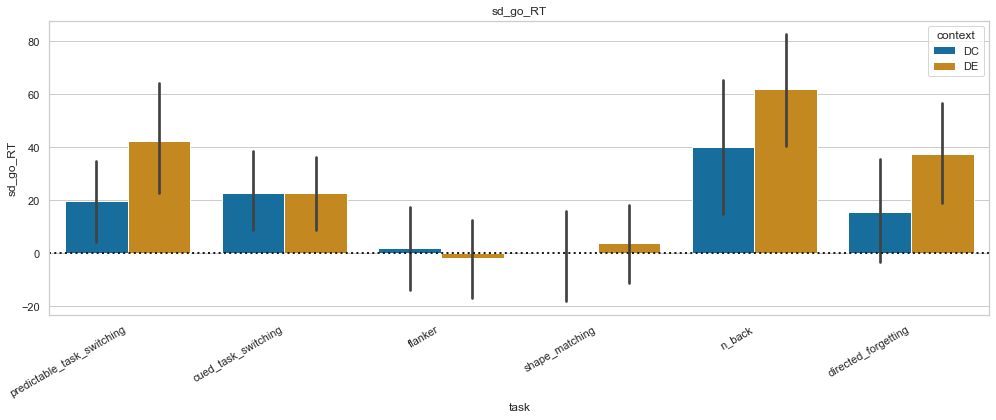

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,110289.865999,5,145,22057.973200,13.725263,5.702308e-11,5.609317e-09,0.227926,0.775681
1,context,11115.446119,1,29,11115.446119,17.511836,2.417565e-04,2.417565e-04,0.022971,1.000000
2,task * context,11537.583257,5,145,2307.516651,3.362570,6.647405e-03,1.489877e-02,0.023844,0.731821


dropping 3


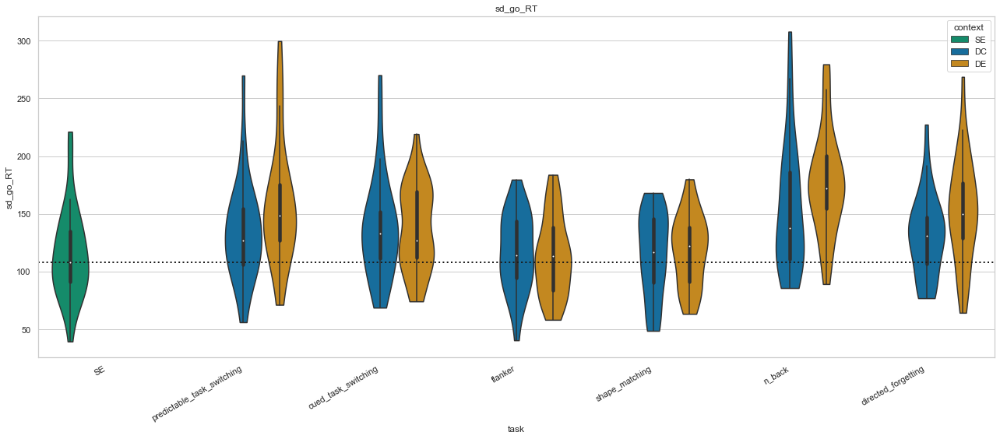

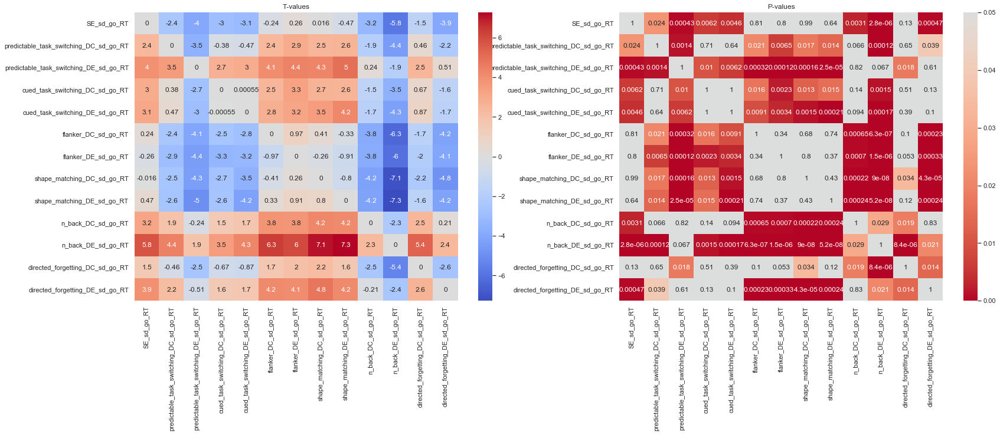

dropping 0


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.444495,2.431445,3.799099,2.555331,2.152555,-0.491428,2.774891,4.150542,-1.036599,1.861491,3.178635,1.990443,2.120898,-1.162604,0.220368,2.150552,3.288214,3.461543,4.685032,-1.074412,-0.946668,3.545128,-0.022039,4.593543,2.917177,2.972141,0.357099
p,0.158321,0.020817,0.000614,0.015564,0.038998,0.626478,0.009143,0.000229,0.307693,0.071882,0.003275,0.055141,0.041774,0.253588,0.826985,0.039169,0.002455,0.001545,0.00005,0.290673,0.350902,0.001232,0.982553,0.000064,0.00641,0.005577,0.723362


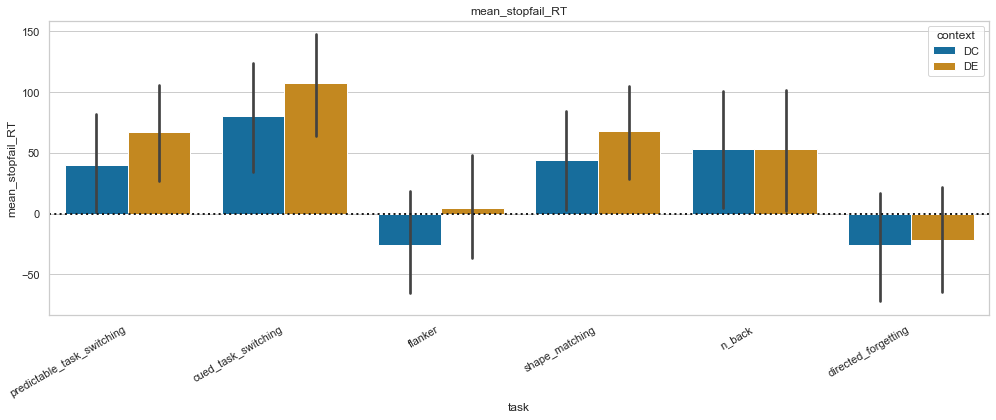

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,667557.835525,5,160,133511.567105,12.872663,1.588202e-10,4.060400e-09,0.247678,0.833223
1,context,34382.537596,1,32,34382.537596,14.433151,6.136896e-04,6.136896e-04,0.012757,1.000000
2,task * context,14793.598080,5,160,2958.719616,1.949525,8.903117e-02,1.166365e-01,0.005489,0.694117


dropping 0


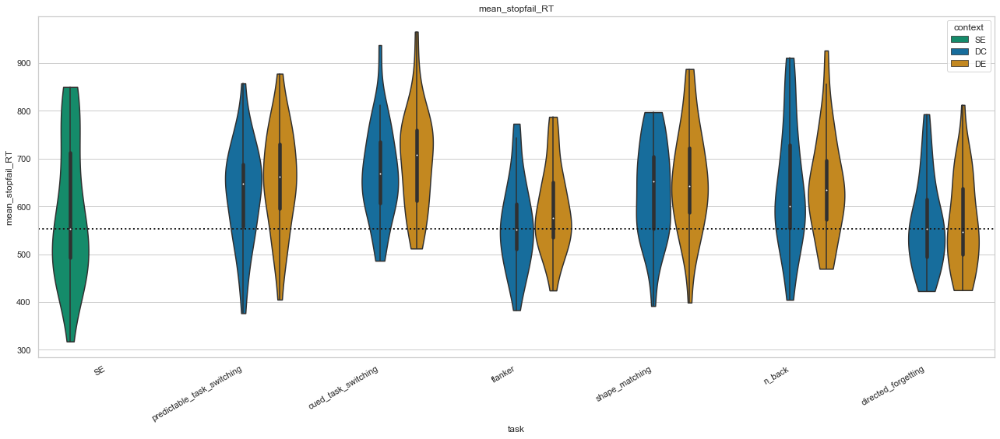

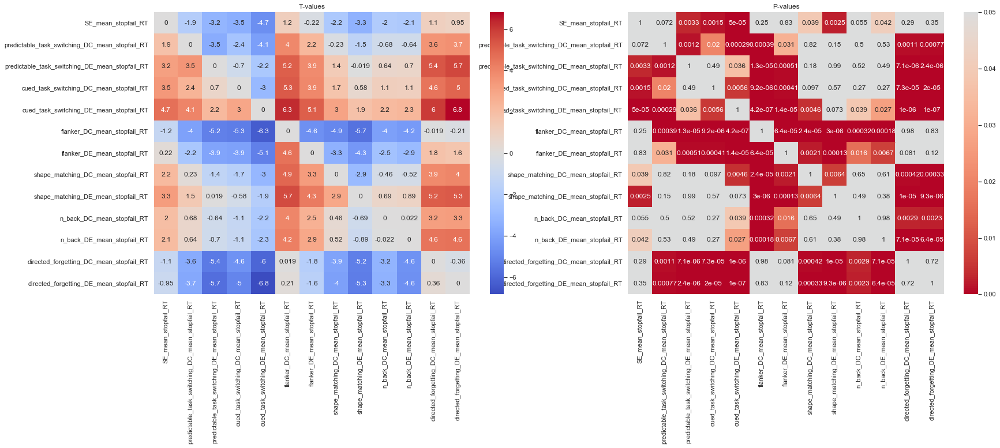

dropping 10


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,3.297436,5.4752,2.011708,3.866611,4.695423,0.574689,1.644735,4.03319,3.475561,2.489703,4.033896,2.707159,4.955939,0.714107,0.032877,1.106933,1.571413,2.711782,3.224747,2.327646,3.312092,2.585512,2.562936,-0.696335,0.392064,-0.183837,0.749335
p,0.003282,0.000017,0.056657,0.000835,0.00011,0.571332,0.114239,0.000556,0.002146,0.02083,0.000555,0.01287,0.000059,0.482669,0.974069,0.28028,0.130359,0.012737,0.003898,0.029527,0.00317,0.016878,0.01774,0.493511,0.698783,0.855825,0.461594


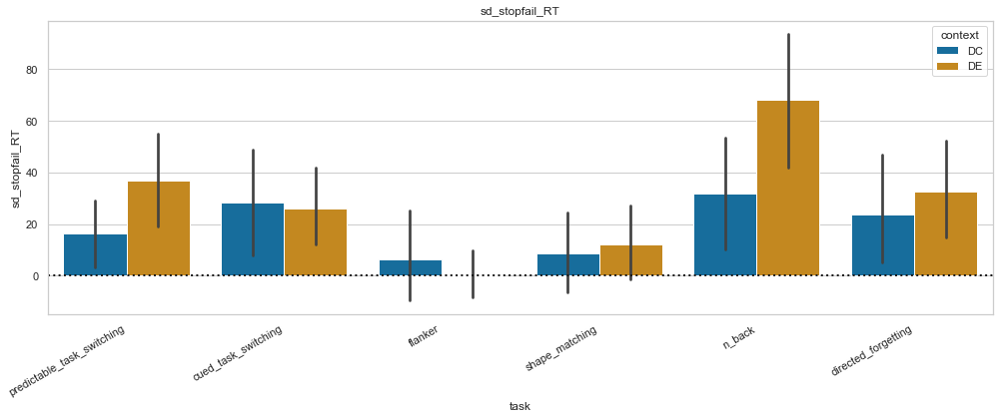

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,61144.627010,5,110,12228.925402,6.823582,0.000014,0.000224,0.131214,0.679583
1,context,7094.234668,1,22,7094.234668,4.046969,0.056657,0.056657,0.015224,1.000000
2,task * context,14567.378701,5,110,2913.475740,2.173024,0.062225,0.073248,0.031261,0.859592


dropping 10


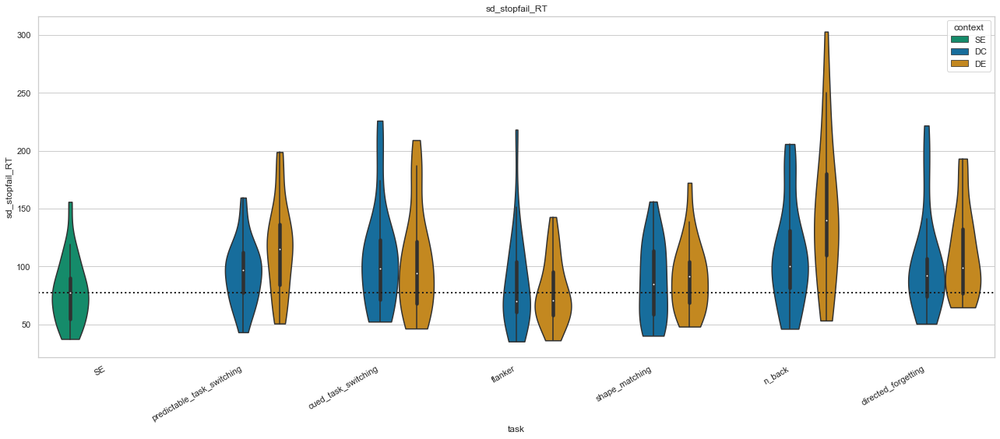

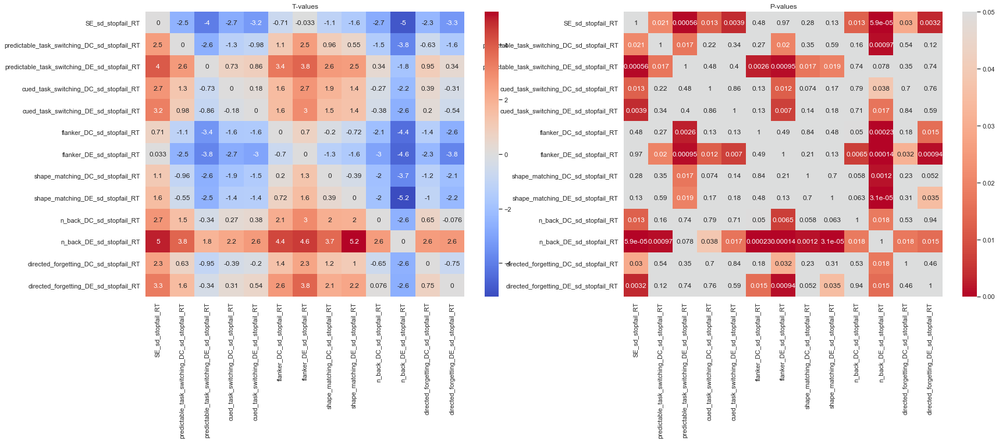

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.601772,1.489738,0.914918,1.402079,1.25008,0.283315,0.302949,1.369764,0.156973,1.899306,0.837658,1.045436,0.492366,0.0,0.492366,0.0,0.569495,1.210176,1.446181,-0.327327,0.526742,-1.428869,-0.594089,0.699854,1.44463,1.650129,1.140704
p,0.122288,0.149319,0.369336,0.173694,0.223323,0.779365,0.764539,0.183441,0.876579,0.069608,0.410487,0.306237,0.626935,1.0,0.626935,1.0,0.574313,0.237996,0.16106,0.746259,0.603208,0.165929,0.558012,0.490747,0.161492,0.111945,0.265249


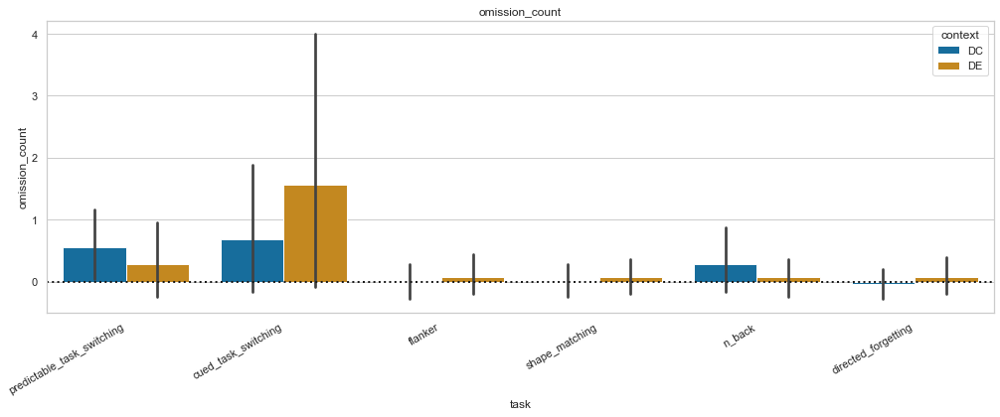

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,45.736667,5,120,9.147333,1.501245,0.194483,0.235864,0.049316,0.275332
1,context,0.963333,1,24,0.963333,0.837075,0.369336,0.369336,0.001039,1.000000
2,task * context,10.536667,5,120,2.107333,2.270426,0.051764,0.112604,0.011361,0.411085


dropping 8


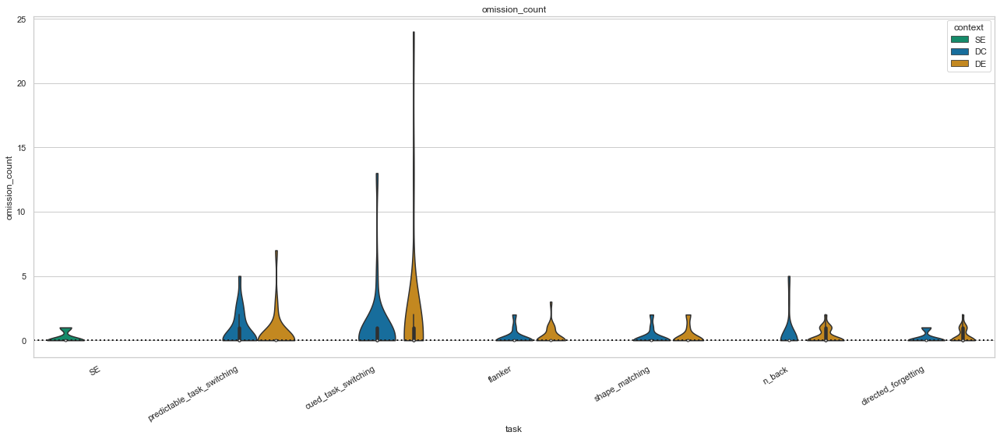

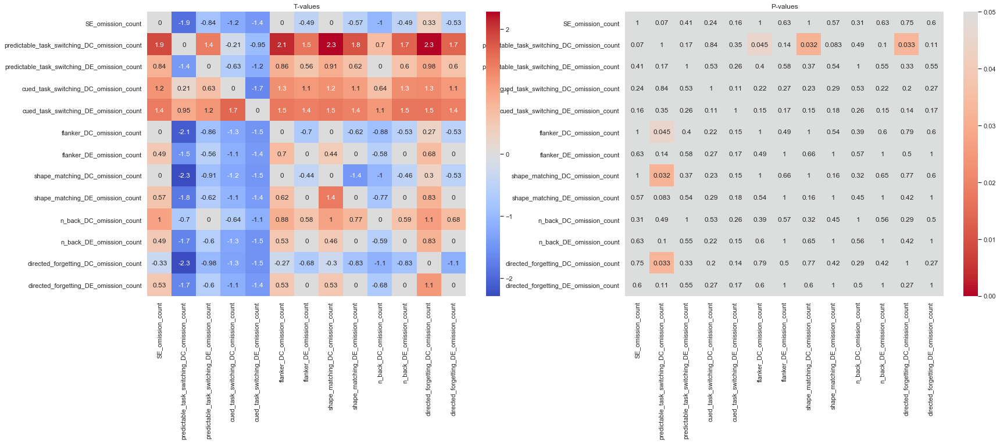

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,2.199516,1.851287,-0.468917,1.570719,1.915999,0.599813,0.244301,1.494706,1.699448,2.081934,0.975185,1.323406,1.188626,0.298234,0.772632,0.324324,0.134005,1.490642,1.48788,1.100038,1.796459,-1.428869,-0.574869,0.699854,-0.526742,-0.214013,1.140704
p,0.037715,0.076473,0.64336,0.12934,0.067351,0.554253,0.809074,0.148025,0.102162,0.048183,0.339196,0.19817,0.246215,0.768091,0.447283,0.748502,0.894516,0.149082,0.149805,0.282227,0.085021,0.165929,0.57073,0.490747,0.603208,0.832345,0.265249


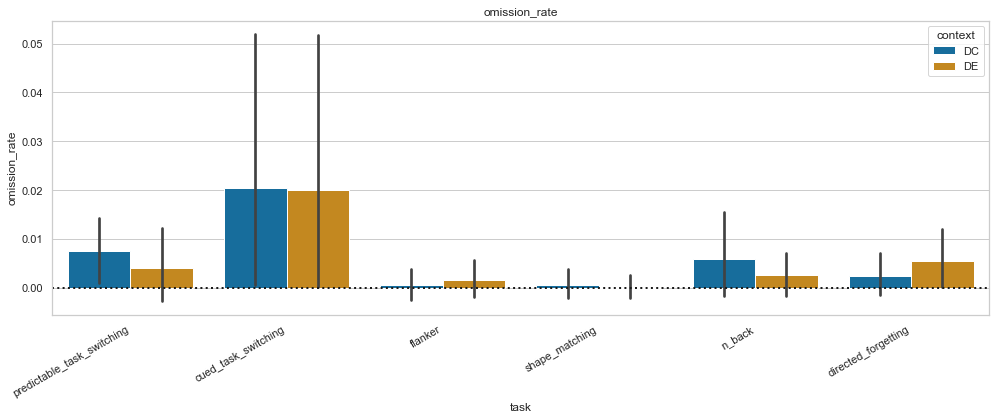

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.013363,5,120,0.002673,1.645395,0.153194,0.212056,0.059747,0.251548
1,context,0.000025,1,24,0.000025,0.219883,0.643360,0.643360,0.000110,1.000000
2,task * context,0.000378,5,120,0.000076,0.738463,0.596079,0.497765,0.001691,0.450997


dropping 8


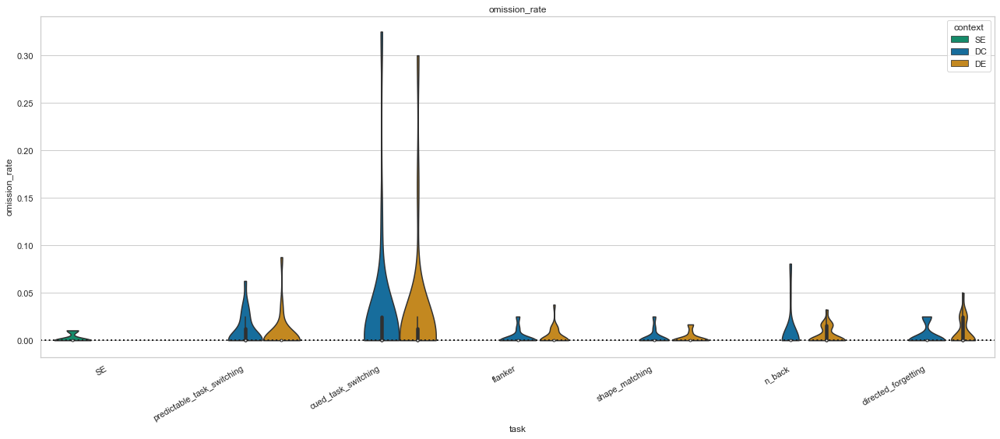

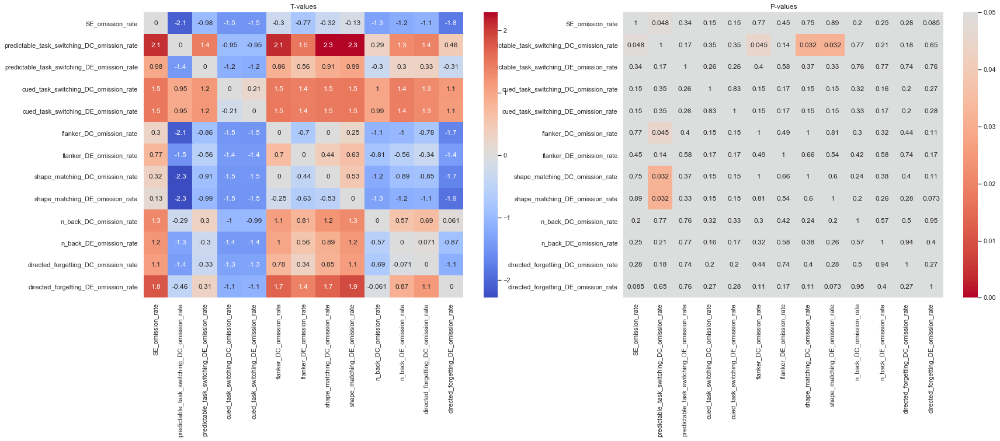

dropping 3


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,-9.397019,-14.984448,-8.870424,-12.356328,-12.629283,-0.978721,-3.174988,-8.657252,-9.523019,-8.963799,-12.256554,-4.938993,-13.439427,0.392537,-2.17504,-2.332249,-3.140396,-7.091805,-8.597159,-3.823292,-8.035849,-4.597107,-5.452621,-3.249773,-1.781054,-3.325207,-4.905453
p,0.0,0.0,0.0,0.0,0.0,0.335813,0.003537,0.0,0.0,0.0,0.0,0.00003,0.0,0.697532,0.037924,0.026837,0.003862,0.0,0.0,0.000645,0.0,0.000078,0.000007,0.002921,0.085382,0.002405,0.000033


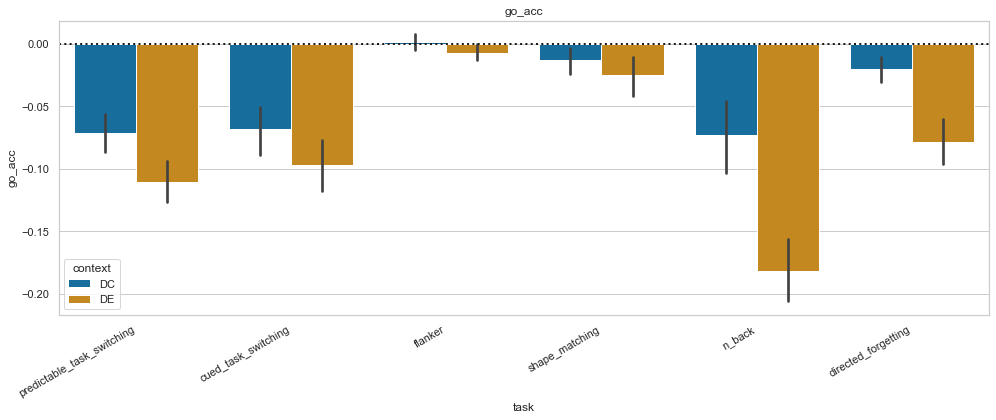

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.662144,5,145,0.132429,54.212240,1.636365e-31,2.168289e-22,0.413192,0.686842
1,context,0.162569,1,29,0.162569,78.684424,9.303710e-10,9.303710e-10,0.101447,1.000000
2,task * context,0.103362,5,145,0.020672,11.514985,2.250658e-09,1.246377e-05,0.064500,0.492618


dropping 3


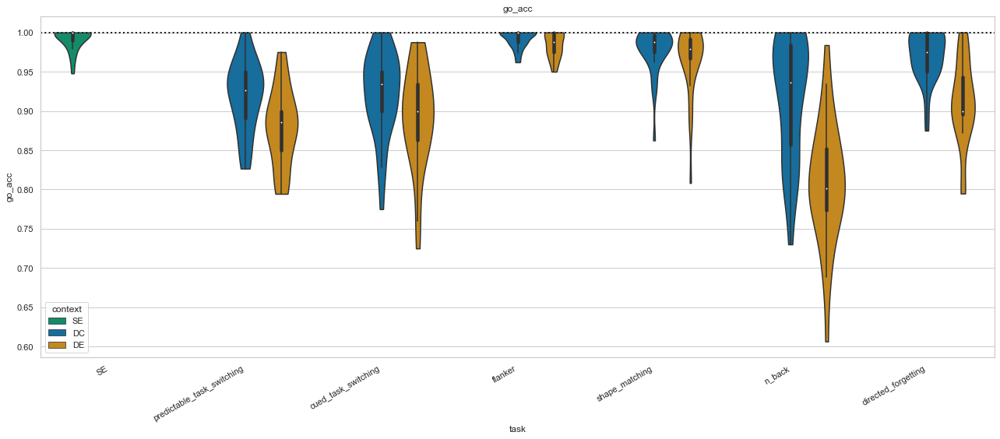

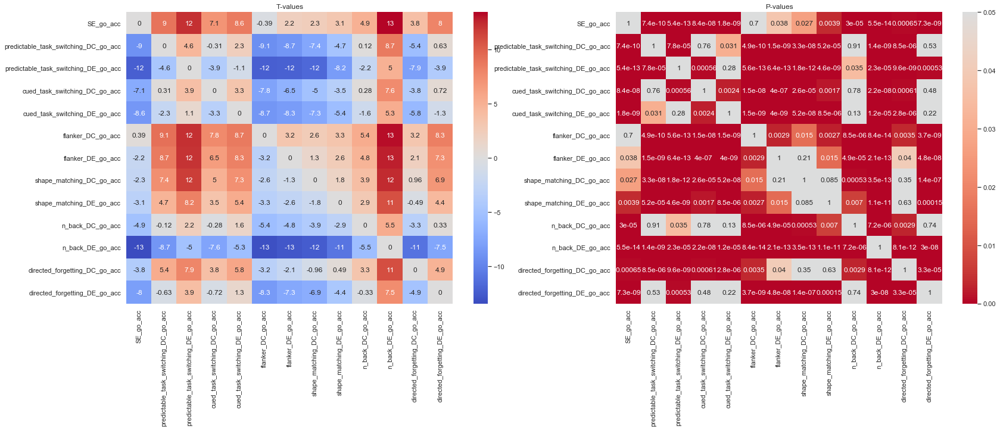

dropping 6


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,-6.853164,-8.847398,-3.103916,-7.099301,-8.30508,-2.174949,-2.74922,-5.655511,-4.751573,-4.257563,-6.637284,-3.729641,-5.441356,-0.832397,-2.583989,-2.001441,-2.382294,-3.480416,-5.493413,-2.80984,-3.80698,-0.888919,-1.021608,-2.139078,-0.760188,-1.998933,-2.341921
p,0.0,0.0,0.004567,0.0,0.0,0.038918,0.01072,0.000006,0.000065,0.000238,0.0,0.000942,0.000011,0.412766,0.015738,0.055883,0.024806,0.001783,0.000009,0.00929,0.000772,0.382198,0.316379,0.041989,0.453981,0.05617,0.027119


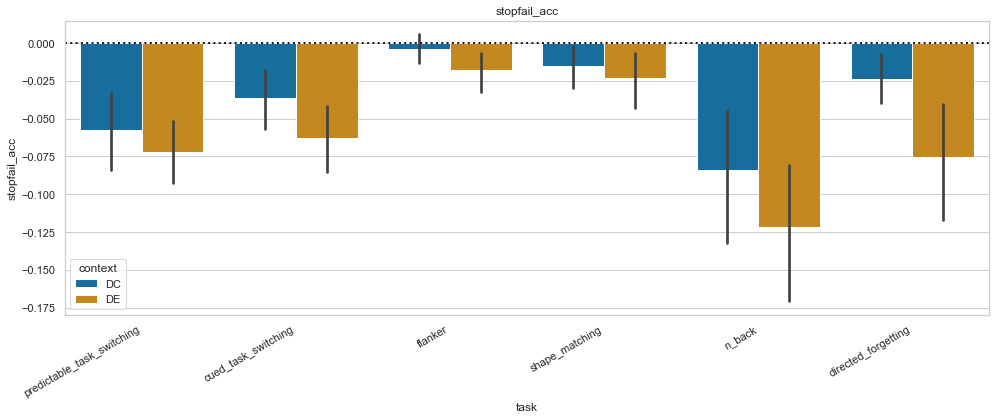

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.294458,5,130,0.058892,14.982724,1.329977e-11,4.062007e-09,0.168282,0.738727
1,context,0.052678,1,26,0.052678,9.634296,4.566519e-03,4.566519e-03,0.030105,1.000000
2,task * context,0.019303,5,130,0.003861,0.687319,6.338780e-01,5.340668e-01,0.011032,0.487137


dropping 6


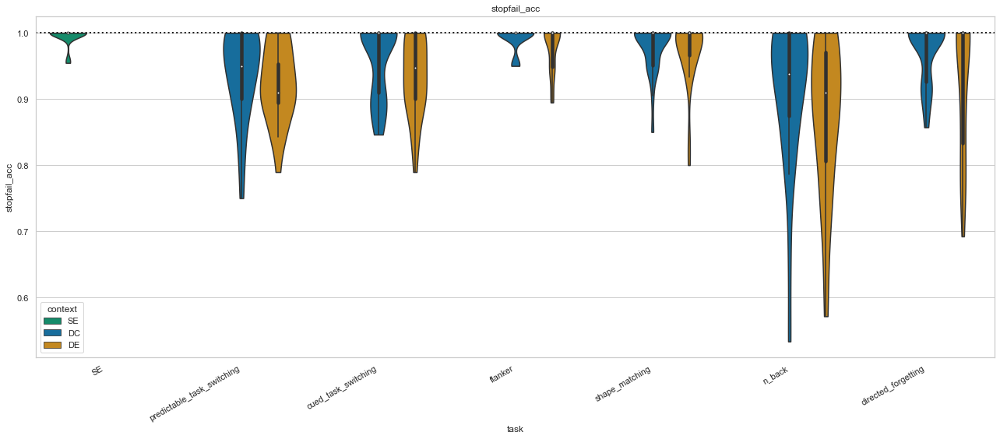

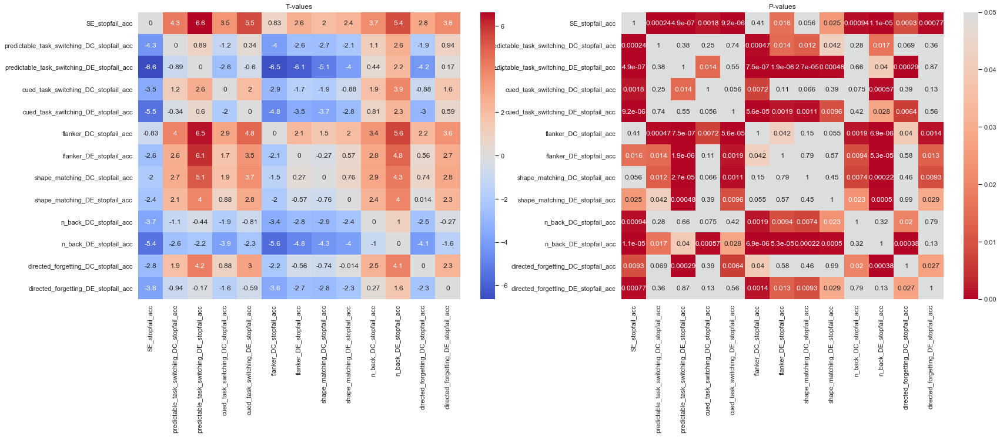

dropping 3


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back>0,n_back_DC>0,n_back_DE>0,flanker>0,flanker_DC>0,flanker_DE>0,shape_matching>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.436774,1.538197,0.584542,1.165745,0.475496,1.283246,1.379676,1.23705,0.474998,1.165745,1.73612,1.84195,0.475496,1.261368,-0.520836,1.283246,0.517199,1.510519,1.379676,0.881402,0.406161,1.23705,0.760699,0.244559,0.474998,-0.360243,2.16426,0.016163,-1.431708,1.21453,-0.644918,-0.497684,2.26757
p,0.161484,0.134841,0.563376,0.253216,0.637996,0.209566,0.178233,0.225993,0.638346,0.253216,0.093157,0.075731,0.637996,0.217229,0.606436,0.209566,0.60894,0.141732,0.178233,0.385347,0.687606,0.225993,0.452978,0.80852,0.638346,0.721276,0.038818,0.987215,0.162918,0.234343,0.52405,0.62246,0.030984


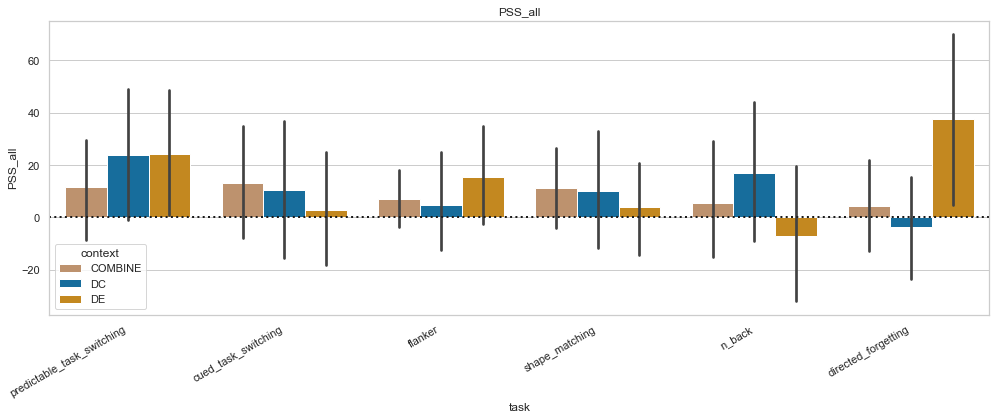

/Users/henrymj/anaconda3/lib/python3.7/site-packages/pingouin/distribution.py:459: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,11928.936700,5,145,2385.787340,0.836642,0.525717,0.491449,0.009237,0.696099
1,context,1483.899191,2,58,741.949595,0.563481,0.572309,0.565150,0.001149,0.957912
2,task * context,43423.984016,10,290,4342.398402,1.690770,0.082283,0.154448,0.033623,0.413777


dropping 3


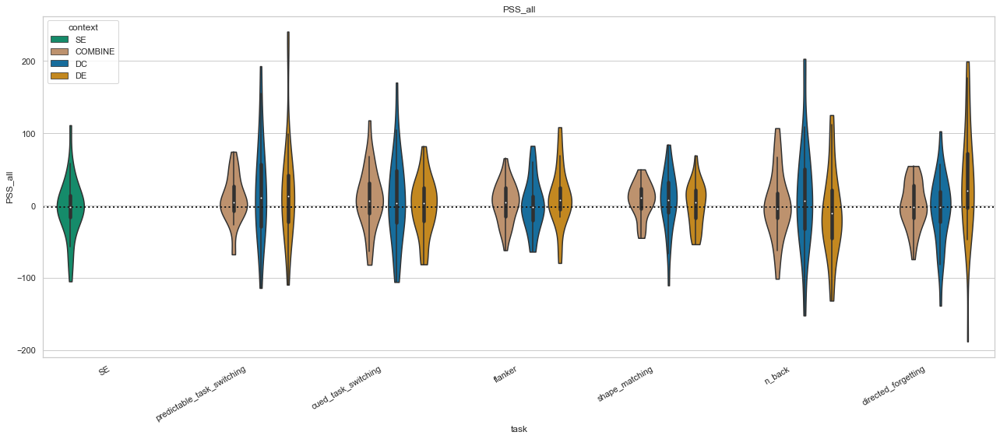

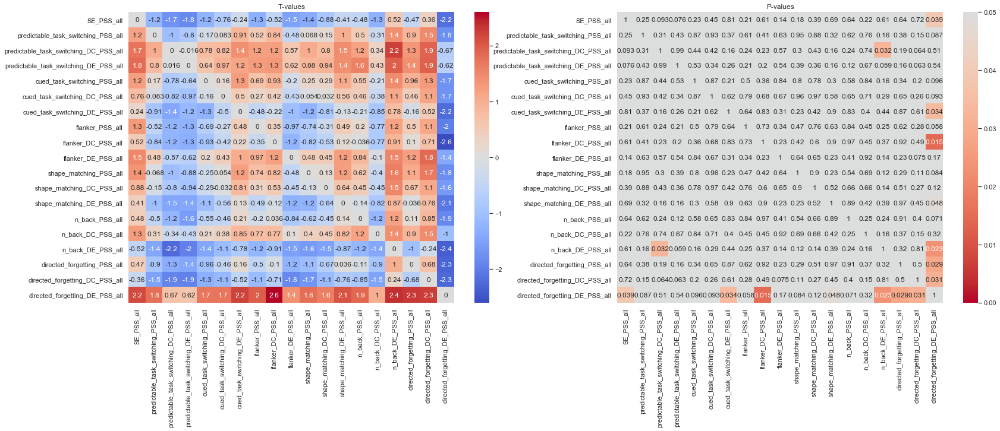

dropping 6


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back>0,n_back_DC>0,n_back_DE>0,flanker>0,flanker_DC>0,flanker_DE>0,shape_matching>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,0.100346,-0.358199,-0.513698,-0.200442,2.436905,0.566159,-0.127943,-0.131698,-2.499088,-0.200442,-1.766996,0.640136,2.436905,3.378579,2.255303,0.566159,-1.800511,-0.369845,-0.127943,-0.674141,-1.462485,-0.131698,0.283141,-0.435204,-2.499088,0.365673,-1.817792,1.476757,-0.078078,1.712204,-0.688194,-0.475492,-1.634027
p,0.920839,0.723086,0.611802,0.842695,0.021965,0.57614,0.899178,0.896237,0.019097,0.842695,0.088967,0.527686,0.021965,0.002306,0.032758,0.57614,0.083393,0.714494,0.899178,0.506172,0.155592,0.896237,0.779311,0.667006,0.019097,0.717567,0.080638,0.151751,0.938364,0.098763,0.497425,0.638407,0.114306


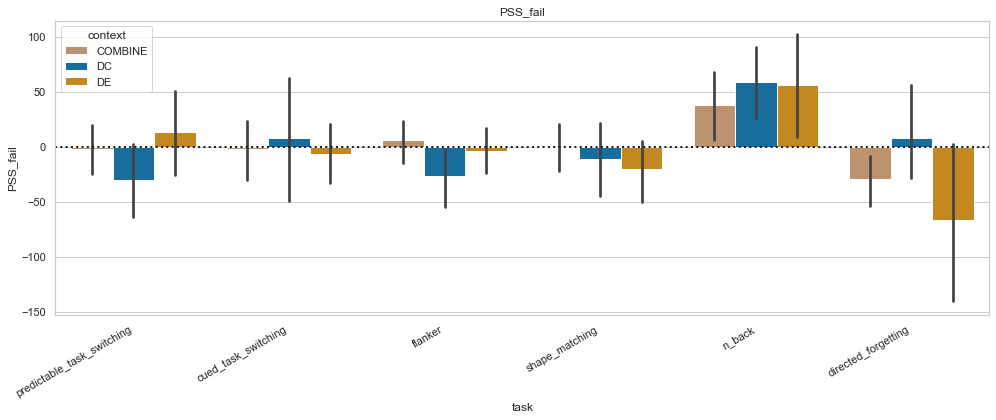

/Users/henrymj/anaconda3/lib/python3.7/site-packages/pingouin/distribution.py:459: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,298525.649445,5,130,59705.129889,8.820015,3.138564e-07,0.000016,0.082690,0.679153
1,context,3840.392970,2,52,1920.196485,0.262499,7.701405e-01,0.725197,0.001064,0.815796
2,task * context,125709.827416,10,260,12570.982742,1.700785,8.065451e-02,0.167714,0.034821,0.331992


dropping 6


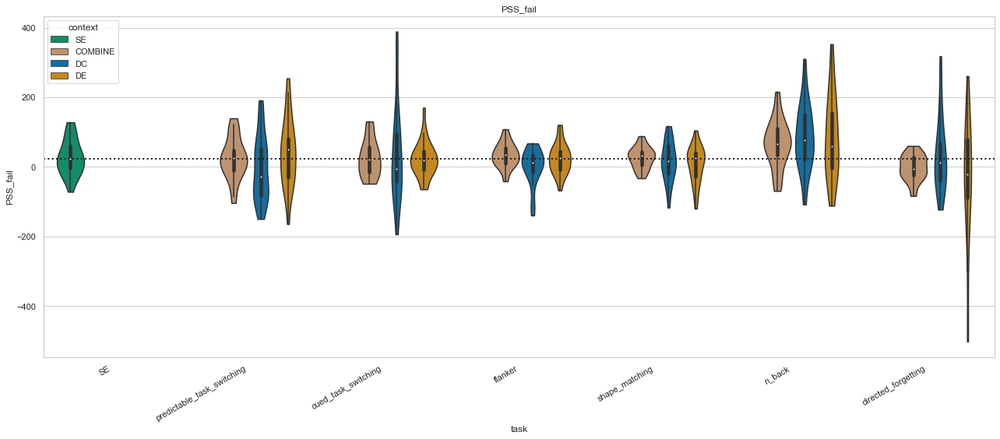

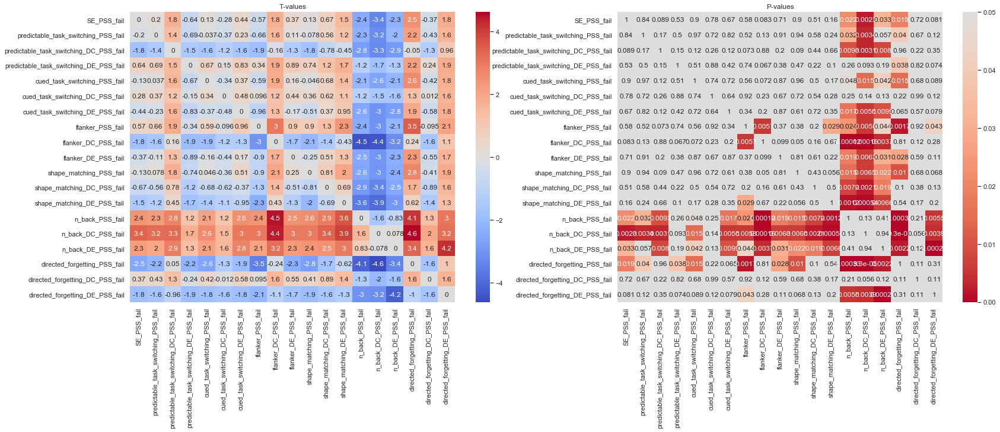

dropping 5


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back>0,n_back_DC>0,n_back_DE>0,flanker>0,flanker_DC>0,flanker_DE>0,shape_matching>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,2.329492,2.745727,1.072465,1.666316,-1.490383,1.08684,1.421936,2.124401,2.713576,1.666316,1.712557,1.657906,-1.490383,-0.302073,-1.139469,1.08684,2.858974,2.505081,1.421936,2.023769,1.520466,2.124401,1.456355,0.725965,2.713576,0.972317,3.307689,-0.5269,-0.739009,-1.047702,-0.925217,-0.599754,2.574235
p,0.027559,0.010611,0.293004,0.107212,0.147714,0.286715,0.166495,0.042941,0.011449,0.107212,0.098257,0.108912,0.147714,0.764911,0.264516,0.286715,0.008095,0.018578,0.166495,0.052994,0.140019,0.042941,0.156826,0.474107,0.011449,0.339524,0.002668,0.602566,0.466278,0.304065,0.363049,0.55367,0.015851


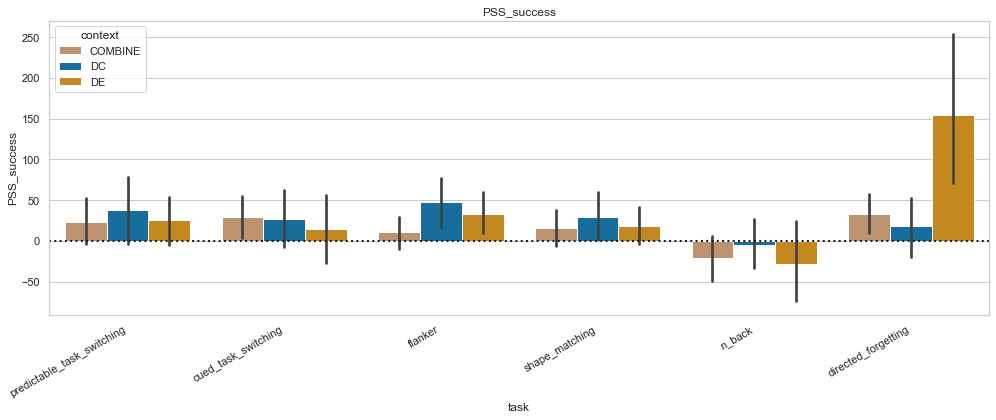

/Users/henrymj/anaconda3/lib/python3.7/site-packages/pingouin/distribution.py:459: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,320194.660808,5,135,64038.932162,7.973958,0.000001,0.000039,0.075108,0.686356
1,context,38224.254767,2,54,19112.127384,3.088749,0.053692,0.072193,0.008966,0.719325
2,task * context,311443.130001,10,270,31144.313000,3.866254,0.000065,0.018829,0.073055,0.245257


dropping 5


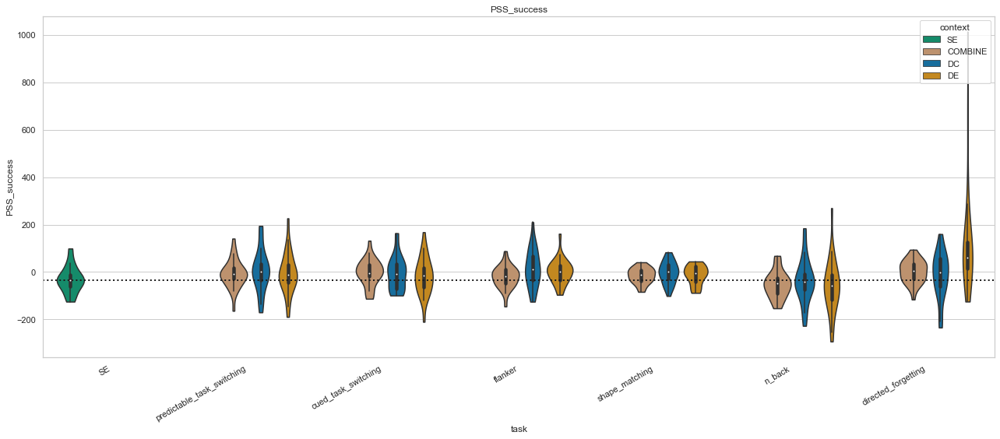

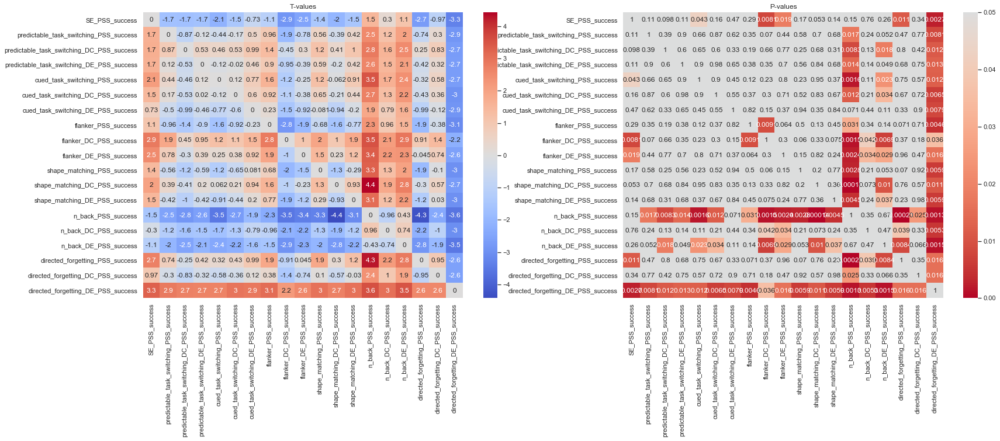

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.476248,2.902833,2.744126,0.209844,3.110827,0.351563,1.923817,1.842865,2.045832,-0.189745,0.648646,1.519909,3.617643,0.329836,0.283332,1.729674,1.926556,1.092629,2.160646,1.118536,2.418108,1.241568,2.689999,-0.056387,0.650928,1.556242,1.259737
p,0.152879,0.007808,0.0113,0.835561,0.004762,0.728234,0.066316,0.077735,0.051882,0.851105,0.522726,0.1416,0.001376,0.744385,0.779352,0.096531,0.065957,0.285403,0.040923,0.274409,0.023556,0.226394,0.012797,0.955501,0.521277,0.13274,0.219877


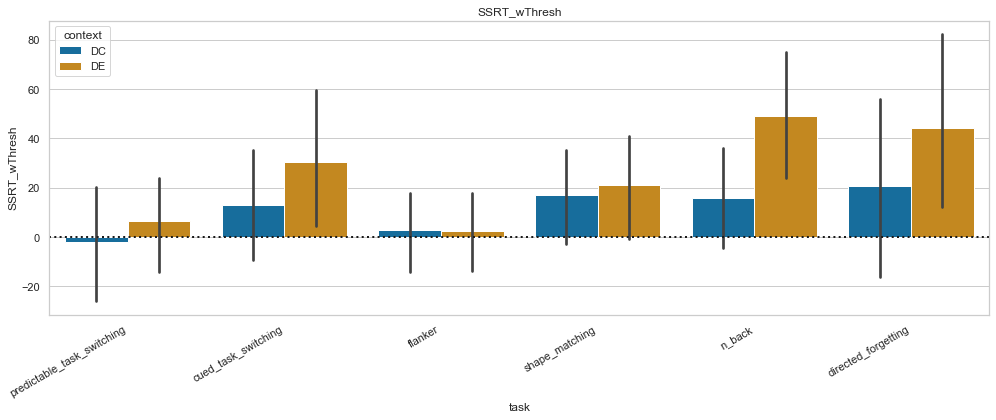

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,46315.497021,5,120,9263.099404,2.365207,0.043691,0.070959,0.059635,0.665008
1,context,15587.514356,1,24,15587.514356,7.530228,0.011300,0.011300,0.020070,1.000000
2,task * context,10020.182312,5,120,2004.036462,1.299327,0.268760,0.279965,0.012902,0.659305


dropping 8


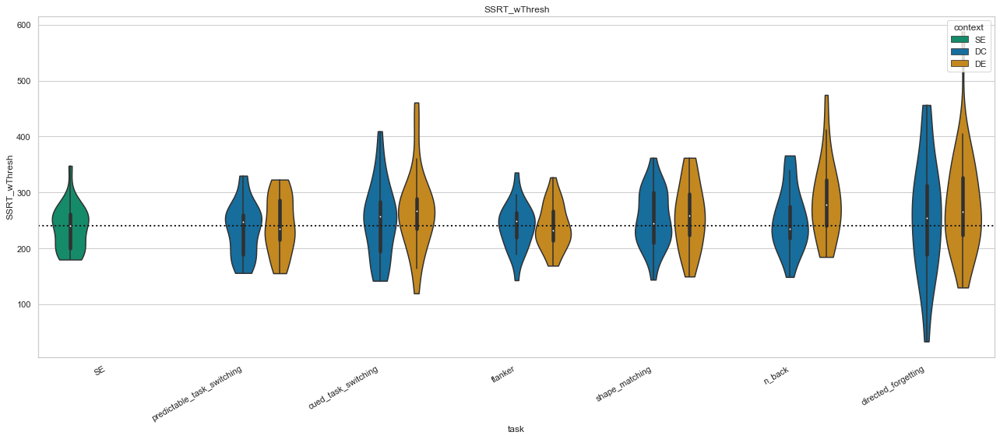

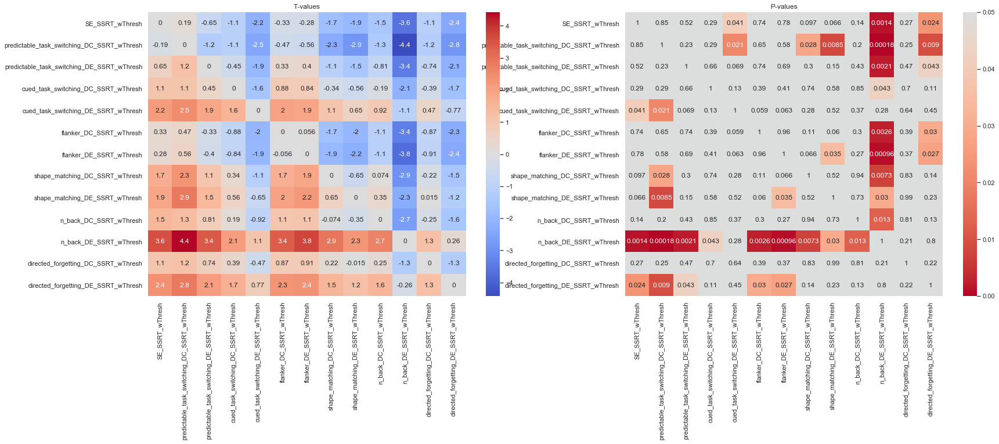

dropping 2


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,-0.559241,-0.226057,2.204393,1.41837,0.275613,-1.678737,-0.658384,1.601102,-2.763647,0.831386,1.96513,0.839411,-0.373847,-2.042313,-1.308745,-1.157608,-0.131719,1.36363,1.814041,-2.623717,-2.880888,3.549507,-2.432291,4.206119,4.875369,2.315872,-1.128748
p,0.580149,0.82269,0.035308,0.166388,0.784735,0.103591,0.515313,0.119834,0.009674,0.412324,0.058718,0.407878,0.711147,0.049996,0.200558,0.256158,0.896086,0.18283,0.079685,0.013544,0.007256,0.001295,0.021182,0.000216,0.000033,0.027584,0.26795


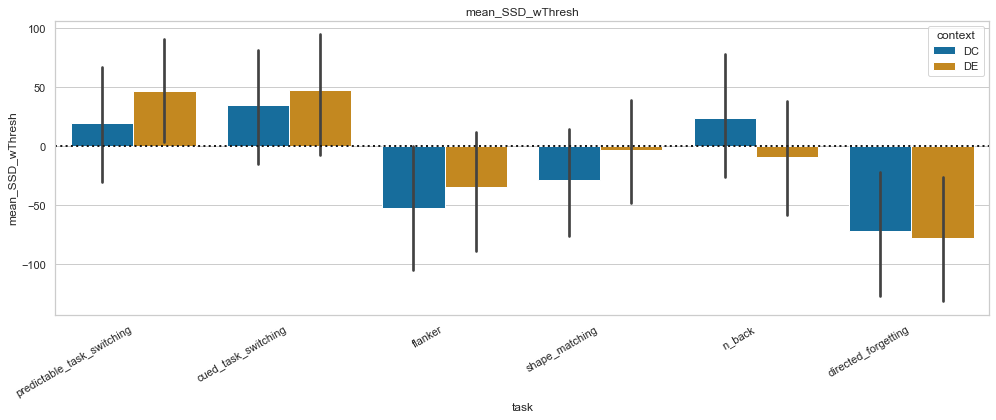

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,626474.909619,5,150,125294.981924,11.630067,1.657502e-09,1.477586e-07,0.255794,0.738973
1,context,5224.910501,1,30,5224.910501,4.859349,3.530772e-02,3.530772e-02,0.002133,1.000000
2,task * context,41241.191608,5,150,8248.238322,9.670478,5.076080e-08,4.635091e-05,0.016839,0.512431


dropping 2


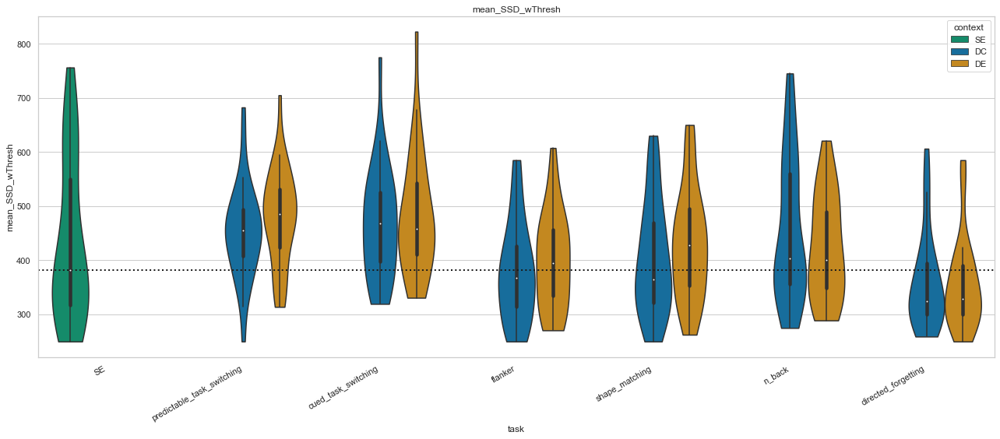

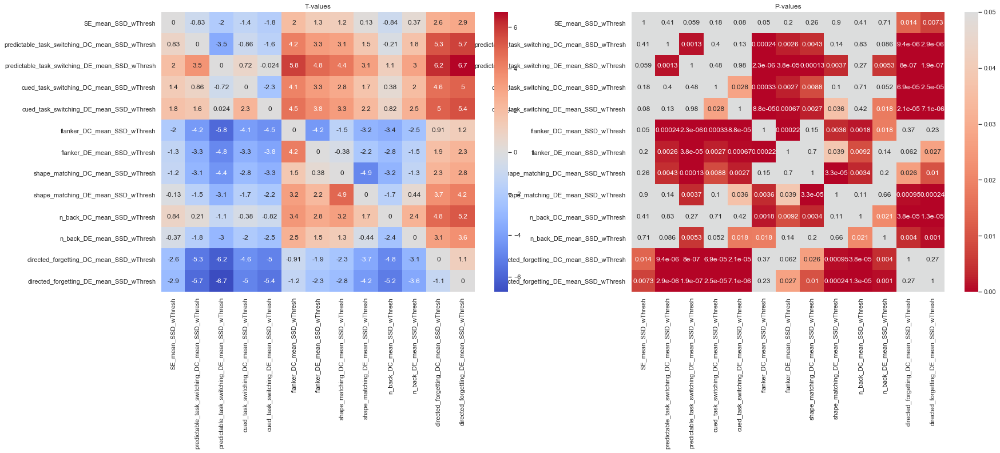

dropping 4


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,0.996706,-0.721997,-1.992326,-1.330285,-2.087249,0.025375,-0.51946,-1.502547,3.328772,-0.849169,-1.702677,-0.603108,-3.138814,0.757039,-0.893827,-0.39163,-0.612584,-1.07983,-1.605195,3.344044,1.381124,-1.621344,-2.355524,-3.124008,-0.388779,-0.222218,-0.937739
p,0.327443,0.476283,0.056167,0.194159,0.046087,0.979936,0.607522,0.144151,0.002453,0.40299,0.099707,0.551291,0.003973,0.45535,0.379033,0.698296,0.545095,0.289432,0.119672,0.002359,0.178165,0.116152,0.025734,0.004124,0.700381,0.825757,0.356398


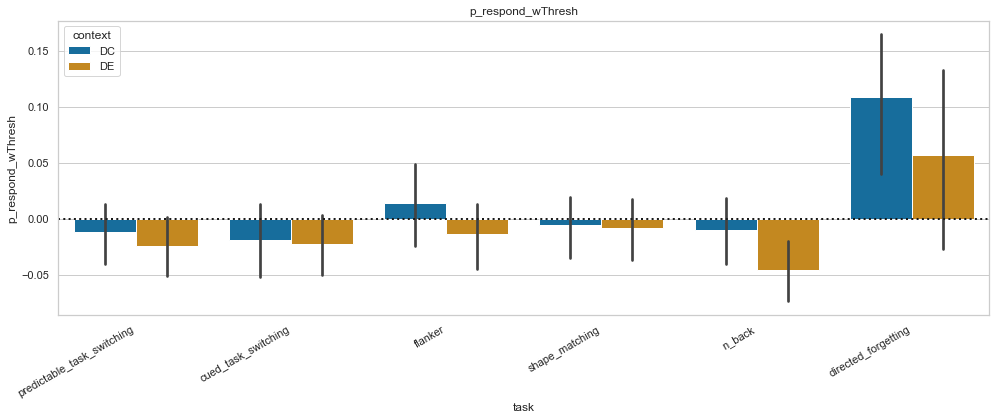

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.486947,5,140,0.097389,10.678913,1.044239e-08,0.000059,0.145758,0.443594
1,context,0.043504,1,28,0.043504,3.969361,5.616680e-02,0.056167,0.013022,1.000000
2,task * context,0.027660,5,140,0.005532,0.645936,6.650359e-01,0.480153,0.008280,0.287316


dropping 4


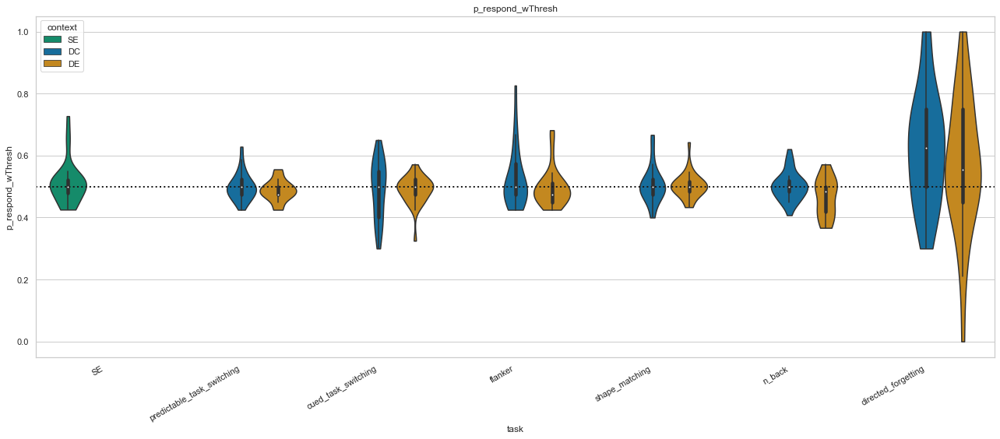

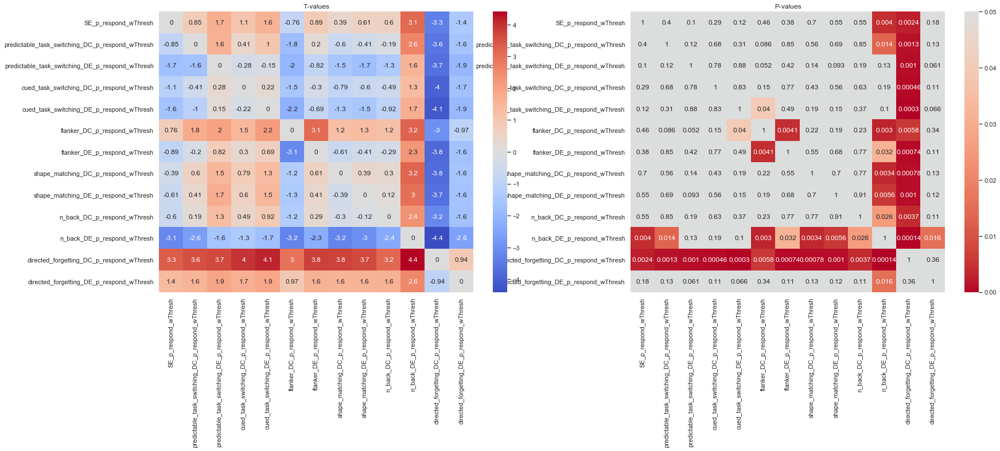

dropping 1


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,0.83997,1.95715,6.695497,2.63815,2.491326,-0.986262,1.424587,3.795227,-1.885992,1.792329,3.396063,2.070862,2.84957,-1.36394,-0.598086,0.865491,1.970457,3.231787,4.324594,-2.295024,-1.465724,5.232176,1.428521,5.619996,5.565897,3.264901,3.589997
p,0.407357,0.059387,0.0,0.01292,0.018287,0.33164,0.164267,0.000643,0.068696,0.082846,0.001891,0.046785,0.007713,0.182409,0.554128,0.393418,0.057773,0.002913,0.000147,0.028661,0.152794,0.000011,0.163141,0.000004,0.000004,0.002672,0.001125


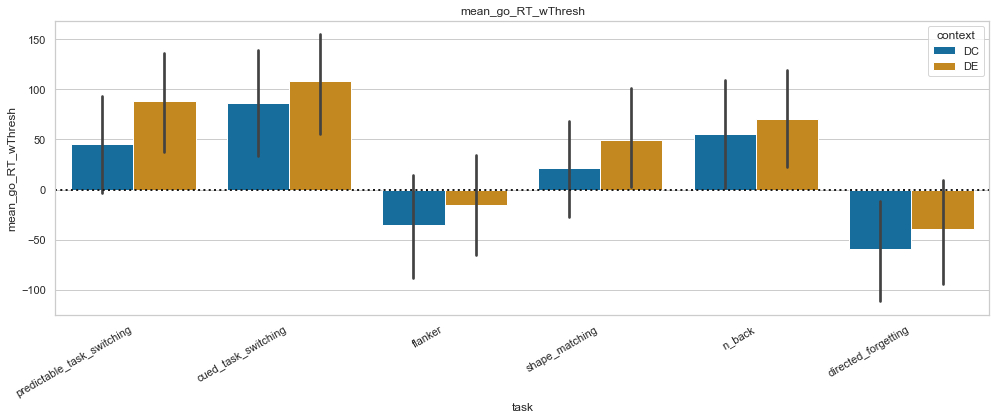

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,1.050954e+06,5,155,210190.894422,17.816789,6.235876e-14,1.341474e-11,0.339882,0.801612
1,context,5.935799e+04,1,31,59357.990697,44.829675,1.725045e-07,1.725045e-07,0.019197,1.000000
2,task * context,7.816834e+03,5,155,1563.366819,2.322263,4.566997e-02,6.285400e-02,0.002528,0.771460


dropping 1


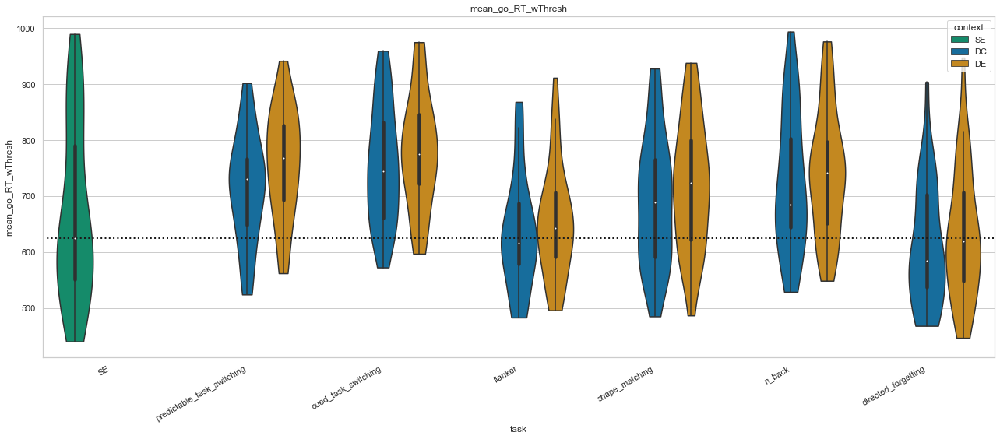

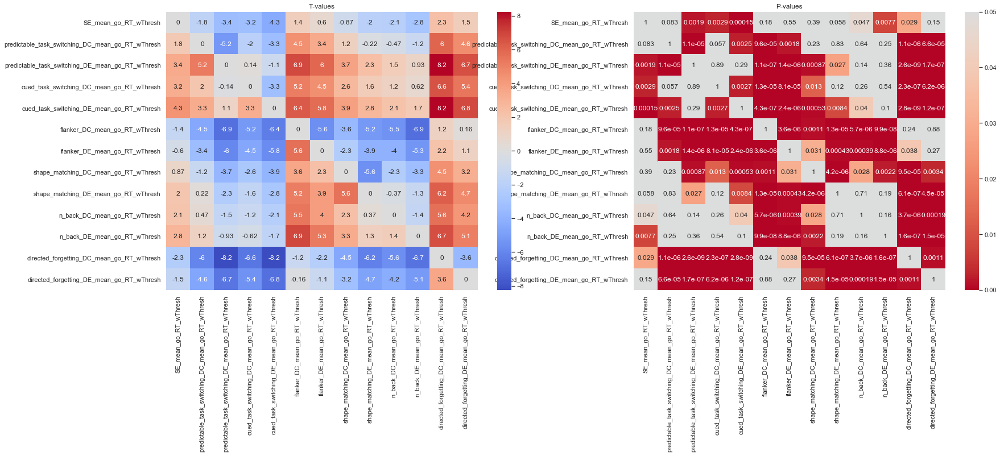

dropping 3


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,2.247822,3.907197,4.184715,3.464551,4.844743,-0.004705,0.219885,3.236585,2.980665,2.388725,3.975621,3.227037,5.790881,0.236681,-0.255649,-0.016211,0.471393,2.954205,3.075193,1.546854,3.937848,3.533419,2.296698,-0.973311,0.795609,-0.000553,2.615176
p,0.032361,0.000514,0.000242,0.001673,0.000039,0.996278,0.827501,0.003022,0.005771,0.023635,0.000427,0.003097,0.000003,0.814568,0.800027,0.987177,0.640888,0.006163,0.004554,0.132743,0.000473,0.001396,0.02905,0.338448,0.432724,0.999563,0.014005


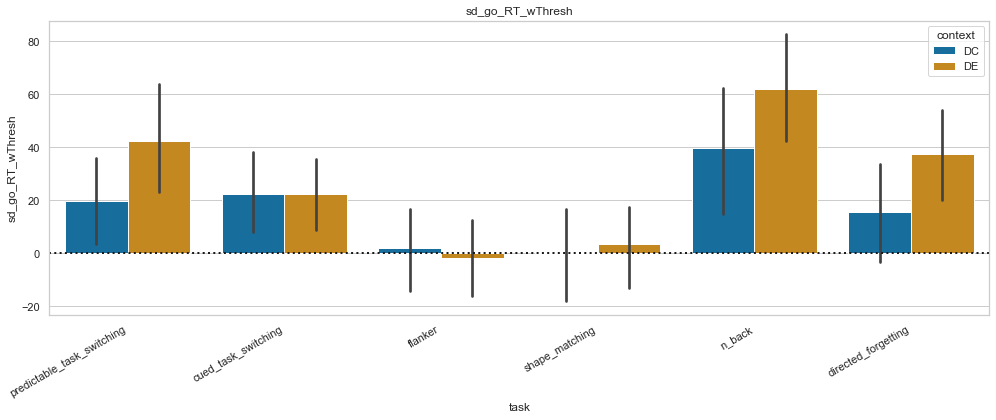

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,110289.865999,5,145,22057.973200,13.725263,5.702308e-11,5.609317e-09,0.227926,0.775681
1,context,11115.446119,1,29,11115.446119,17.511836,2.417565e-04,2.417565e-04,0.022971,1.000000
2,task * context,11537.583257,5,145,2307.516651,3.362570,6.647405e-03,1.489877e-02,0.023844,0.731821


dropping 3


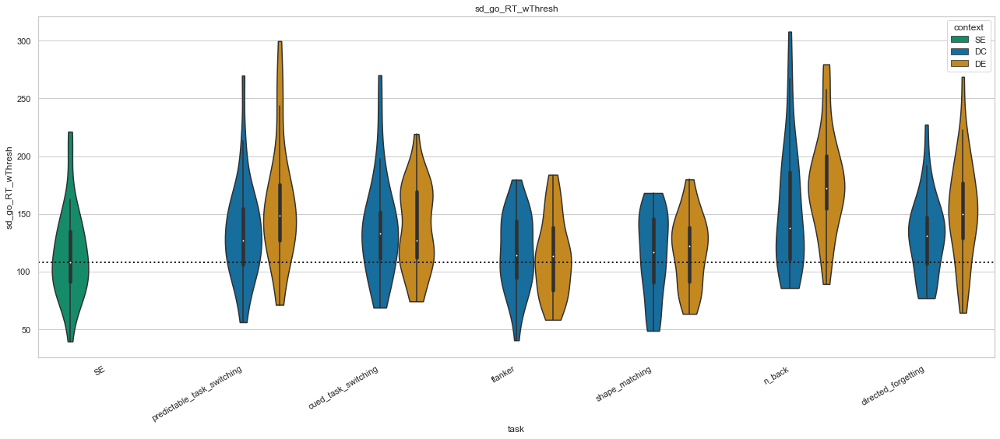

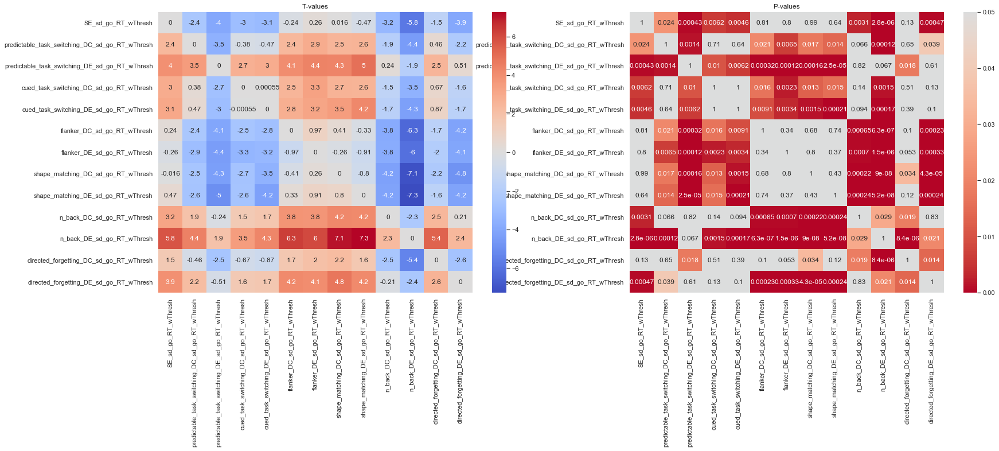

dropping 2


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.367057,2.29179,3.376941,2.357549,1.936022,-0.711773,2.358921,3.794815,0.01623,1.715721,2.935172,1.798997,1.870171,-1.347947,-0.059346,1.690784,2.960679,3.129975,4.332526,-0.157214,0.181866,3.376259,-0.012152,4.218265,3.399694,2.632409,0.578125
p,0.181765,0.02911,0.002044,0.025114,0.062337,0.482104,0.025036,0.000669,0.987158,0.096525,0.00634,0.082087,0.071246,0.187767,0.95307,0.101244,0.005949,0.003876,0.000152,0.876129,0.856911,0.002047,0.990385,0.000209,0.001925,0.013266,0.567494


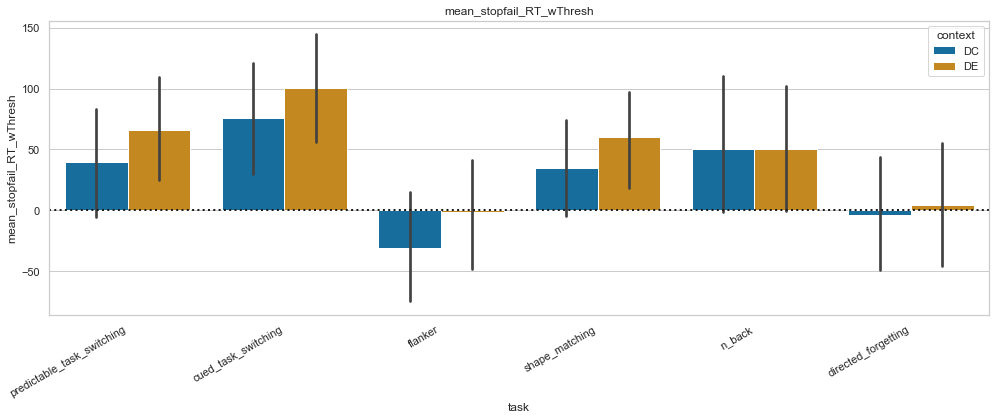

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,456171.543594,5,150,91234.308719,8.874758,2.113979e-07,0.000003,0.188929,0.801939
1,context,34440.652617,1,30,34440.652617,11.403733,2.043771e-03,0.002044,0.014264,1.000000
2,task * context,11320.191244,5,150,2264.038249,1.213128,3.057088e-01,0.309452,0.004688,0.580132


dropping 2


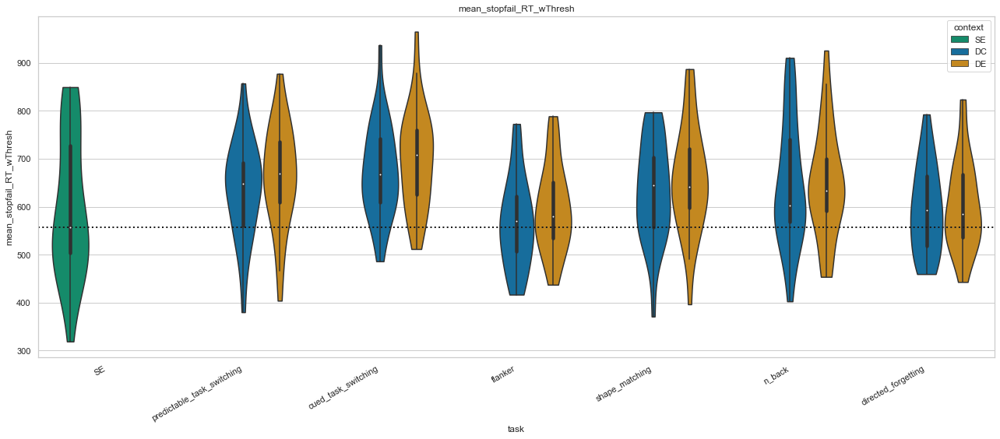

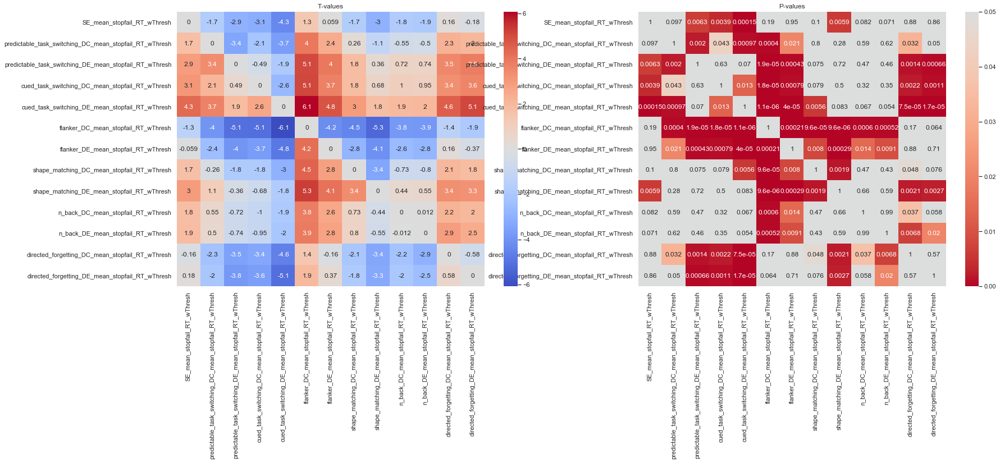

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.810107,2.799424,1.678768,2.158245,3.263495,-0.737175,1.638567,1.660839,2.146964,0.675084,3.138858,1.80861,3.658473,-0.860262,-0.539768,1.569326,1.176413,1.484228,1.258052,1.220877,2.274706,2.334542,1.740341,0.592336,-0.466101,-0.447702,0.469144
p,0.082819,0.009942,0.106172,0.04113,0.003292,0.468162,0.114349,0.109756,0.04211,0.506075,0.004452,0.083059,0.001243,0.398157,0.59433,0.129664,0.250967,0.150765,0.220476,0.233992,0.032147,0.028263,0.094608,0.559166,0.645346,0.658383,0.6432


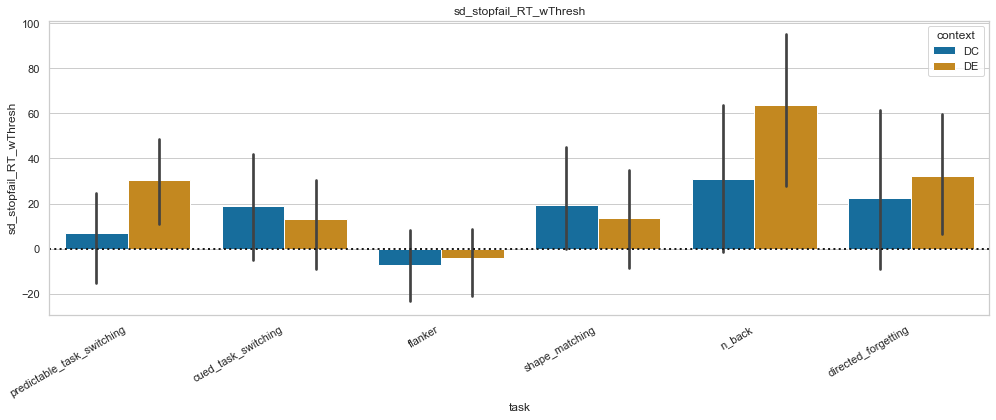

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,74411.693436,5,120,14882.338687,4.954052,0.000370,0.001639,0.089671,0.733687
1,context,6692.024634,1,24,6692.024634,2.818263,0.106172,0.106172,0.008064,1.000000
2,task * context,15604.144555,5,120,3120.828911,1.186462,0.319872,0.321520,0.018804,0.645272


dropping 8


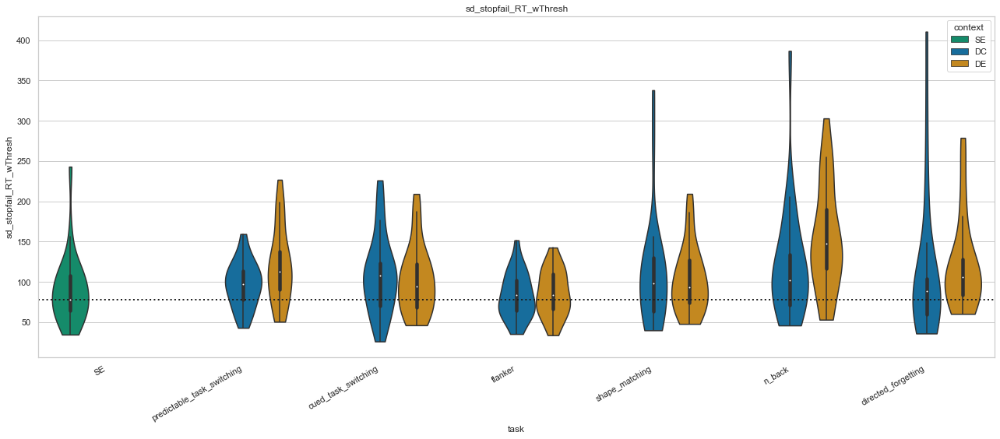

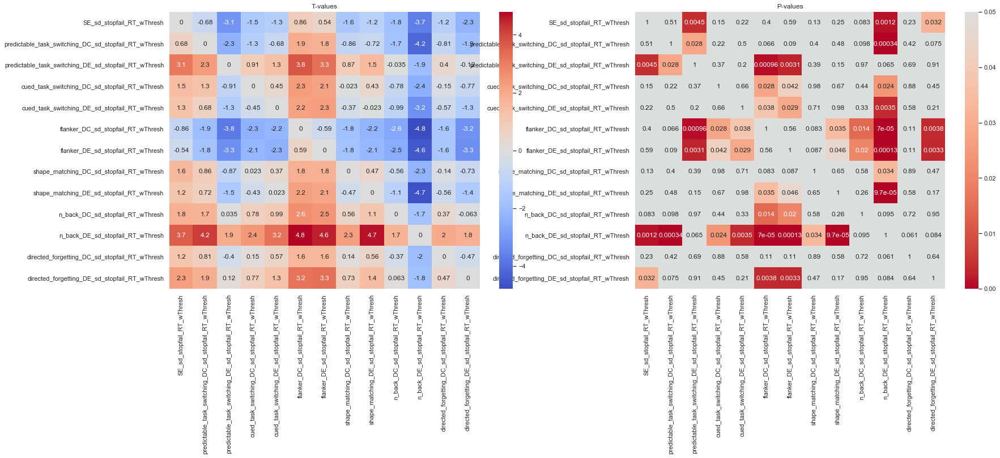

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.601772,1.489738,0.914918,1.402079,1.25008,0.283315,0.302949,1.369764,0.156973,1.899306,0.837658,1.045436,0.492366,0.0,0.492366,0.0,0.569495,1.210176,1.446181,-0.327327,0.526742,-1.428869,-0.594089,0.699854,1.44463,1.650129,1.140704
p,0.122288,0.149319,0.369336,0.173694,0.223323,0.779365,0.764539,0.183441,0.876579,0.069608,0.410487,0.306237,0.626935,1.0,0.626935,1.0,0.574313,0.237996,0.16106,0.746259,0.603208,0.165929,0.558012,0.490747,0.161492,0.111945,0.265249


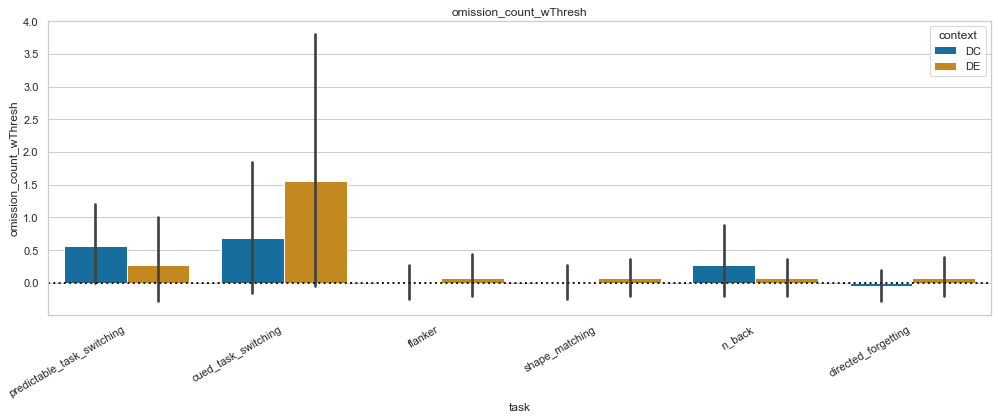

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,45.736667,5,120,9.147333,1.501245,0.194483,0.235864,0.049316,0.275332
1,context,0.963333,1,24,0.963333,0.837075,0.369336,0.369336,0.001039,1.000000
2,task * context,10.536667,5,120,2.107333,2.270426,0.051764,0.112604,0.011361,0.411085


dropping 8


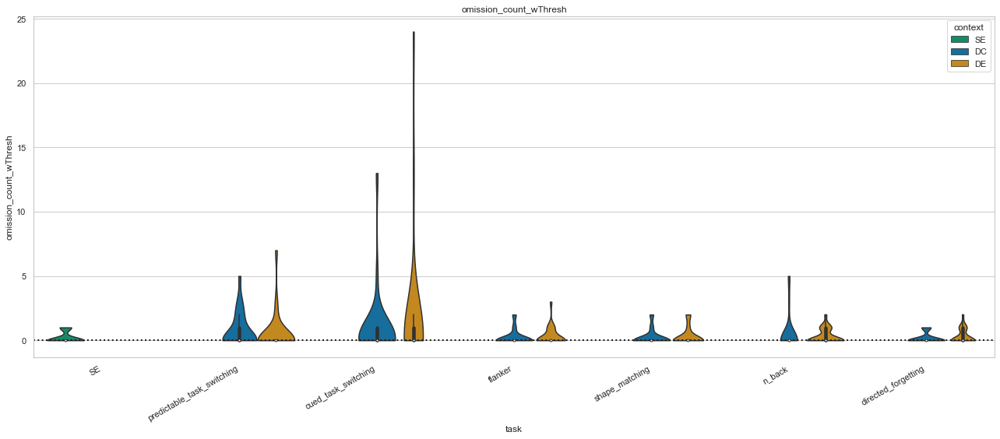

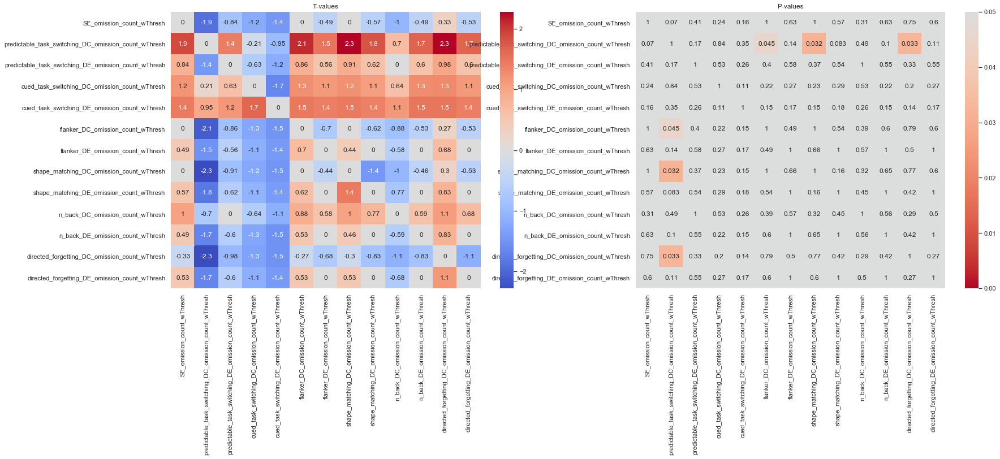

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,2.199516,1.851287,-0.468917,1.570719,1.915999,0.599813,0.244301,1.494706,1.699448,2.081934,0.975185,1.323406,1.188626,0.298234,0.772632,0.324324,0.134005,1.490642,1.48788,1.100038,1.796459,-1.428869,-0.574869,0.699854,-0.526742,-0.214013,1.140704
p,0.037715,0.076473,0.64336,0.12934,0.067351,0.554253,0.809074,0.148025,0.102162,0.048183,0.339196,0.19817,0.246215,0.768091,0.447283,0.748502,0.894516,0.149082,0.149805,0.282227,0.085021,0.165929,0.57073,0.490747,0.603208,0.832345,0.265249


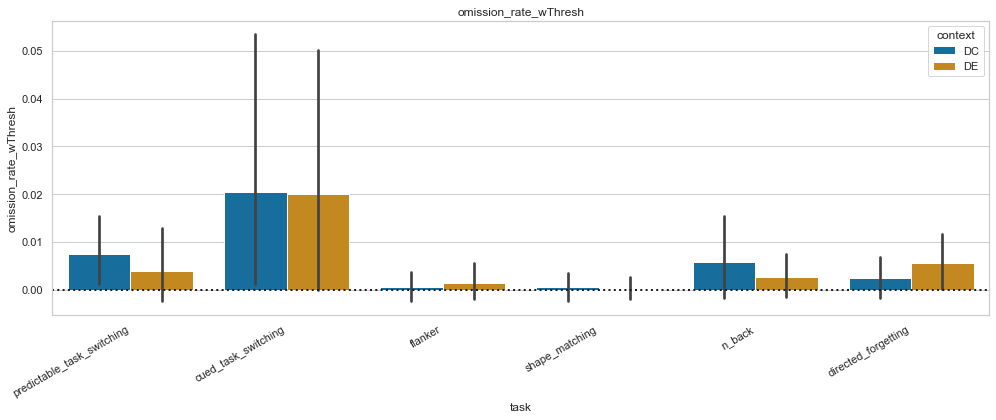

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.013363,5,120,0.002673,1.645395,0.153194,0.212056,0.059747,0.251548
1,context,0.000025,1,24,0.000025,0.219883,0.643360,0.643360,0.000110,1.000000
2,task * context,0.000378,5,120,0.000076,0.738463,0.596079,0.497765,0.001691,0.450997


dropping 8


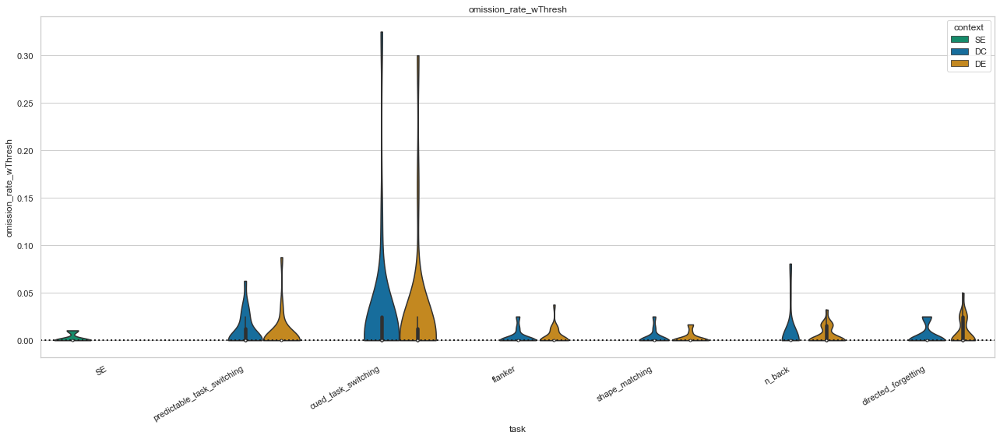

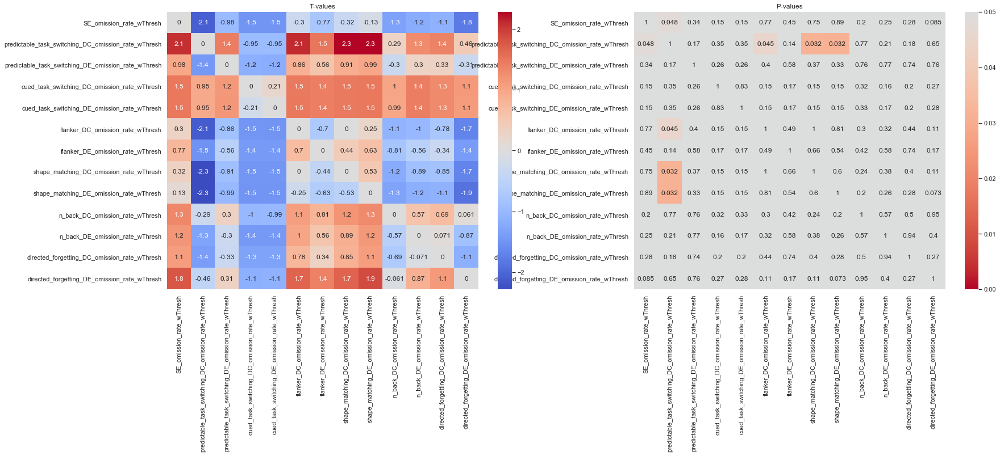

dropping 3


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,-9.397019,-14.984448,-8.870424,-12.356328,-12.629283,-0.978721,-3.174988,-8.657252,-9.523019,-8.963799,-12.256554,-4.938993,-13.439427,0.392537,-2.17504,-2.332249,-3.140396,-7.091805,-8.597159,-3.823292,-8.035849,-4.597107,-5.452621,-3.249773,-1.781054,-3.325207,-4.905453
p,0.0,0.0,0.0,0.0,0.0,0.335813,0.003537,0.0,0.0,0.0,0.0,0.00003,0.0,0.697532,0.037924,0.026837,0.003862,0.0,0.0,0.000645,0.0,0.000078,0.000007,0.002921,0.085382,0.002405,0.000033


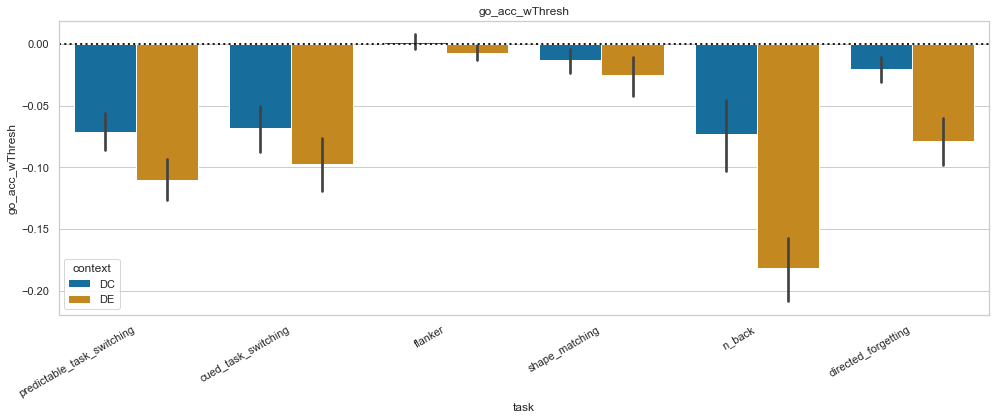

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.662144,5,145,0.132429,54.212240,1.636365e-31,2.168289e-22,0.413192,0.686842
1,context,0.162569,1,29,0.162569,78.684424,9.303710e-10,9.303710e-10,0.101447,1.000000
2,task * context,0.103362,5,145,0.020672,11.514985,2.250658e-09,1.246377e-05,0.064500,0.492618


dropping 3


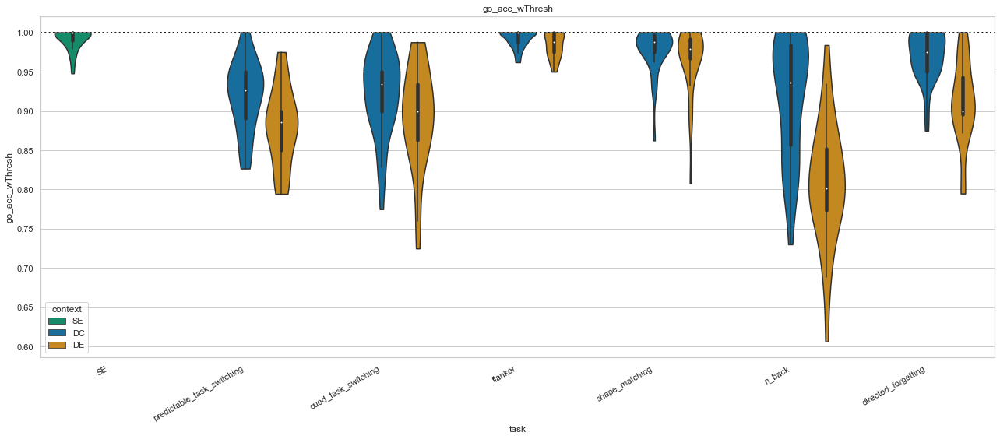

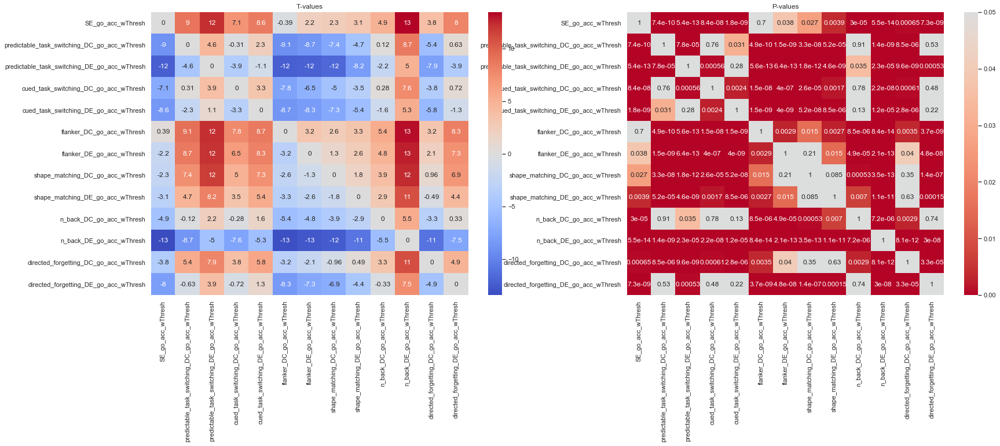

dropping 8


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back_DC>0,n_back_DE>0,flanker_DC>0,flanker_DE>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,-5.729392,-7.065565,-3.018506,-6.856101,-7.869106,-1.870751,-2.596529,-5.173417,-3.000973,-3.999774,-5.570524,-3.37649,-5.23114,-0.926493,-2.099496,-1.715456,-2.661776,-3.27615,-4.928509,-1.328812,-2.883016,-1.133794,-0.813839,-1.598998,-2.171363,-2.019876,-2.270239
p,0.000007,0.0,0.005939,0.0,0.0,0.073622,0.015828,0.000027,0.006191,0.000527,0.00001,0.002498,0.000023,0.363413,0.04647,0.099146,0.013649,0.003192,0.00005,0.196406,0.00818,0.26808,0.423739,0.122905,0.040015,0.054695,0.032456


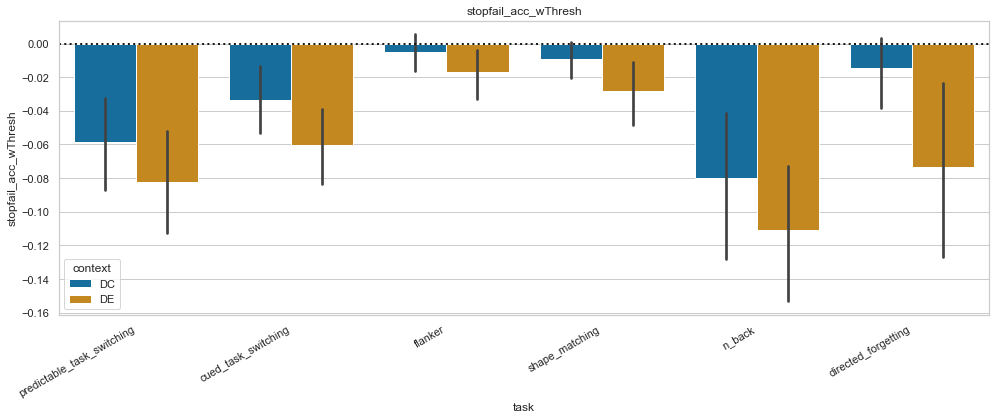

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,0.249959,5,120,0.049992,11.463503,4.669267e-09,0.000002,0.146248,0.644599
1,context,0.060962,1,24,0.060962,9.111381,5.938531e-03,0.005939,0.035668,1.000000
2,task * context,0.016794,5,120,0.003359,0.577804,7.169037e-01,0.614999,0.009826,0.543103


dropping 8


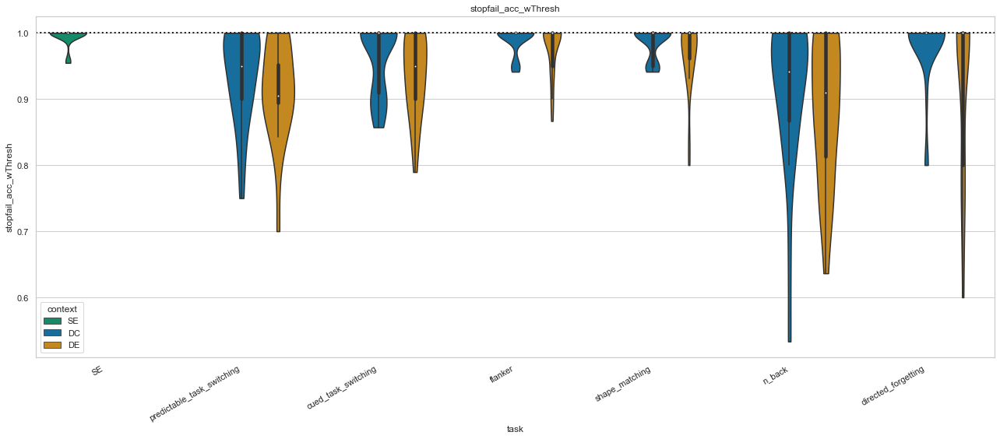

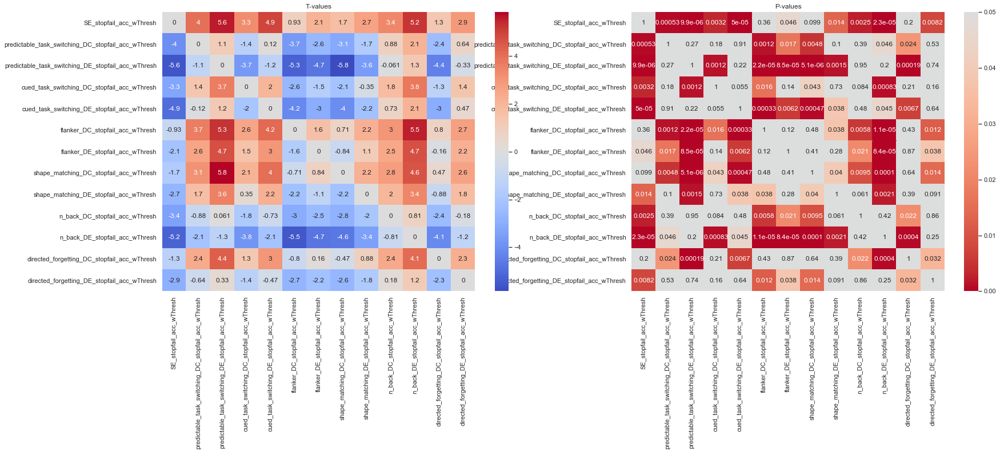

dropping 9


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back>0,n_back_DC>0,n_back_DE>0,flanker>0,flanker_DC>0,flanker_DE>0,shape_matching>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,0.588887,0.964011,0.388561,0.712001,0.325219,0.227262,0.951077,1.490334,-0.976771,0.712001,0.841543,1.648773,0.325219,0.87309,-0.833028,0.227262,0.847609,1.30148,0.951077,1.519213,0.483925,1.490334,0.591927,0.28987,-0.976771,-0.982332,0.812483,0.490821,-1.205129,0.439441,-1.440218,-0.338516,1.30875
p,0.561677,0.345068,0.701175,0.483625,0.747955,0.822228,0.351453,0.149724,0.338845,0.483625,0.408709,0.112788,0.747955,0.391638,0.413396,0.822228,0.40539,0.20598,0.351453,0.142337,0.633015,0.149724,0.559674,0.774513,0.338845,0.336157,0.424845,0.628203,0.240407,0.664443,0.16328,0.738045,0.203546


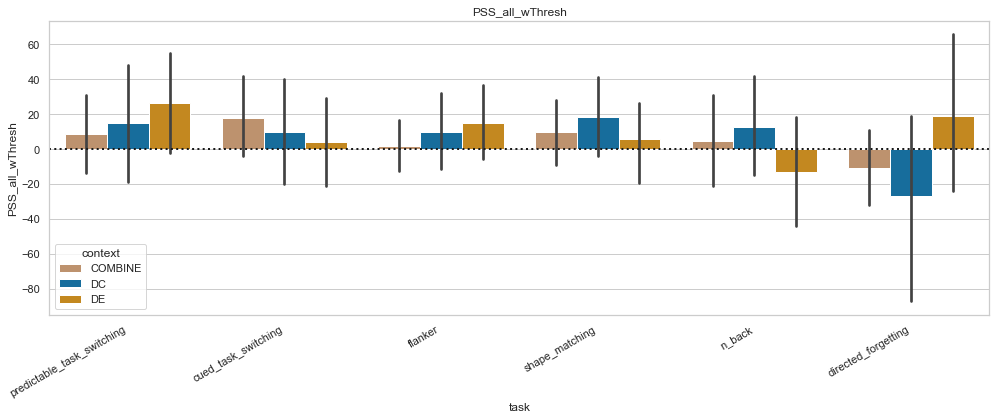

/Users/henrymj/anaconda3/lib/python3.7/site-packages/pingouin/distribution.py:459: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,23771.990270,5,115,4754.398054,1.412332,0.225002,0.241561,0.016505,0.698937
1,context,1309.316745,2,46,654.658372,0.248527,0.780989,0.695113,0.000909,0.681795
2,task * context,42599.576464,10,230,4259.957646,1.133640,0.337869,0.342882,0.029578,0.321681


dropping 9


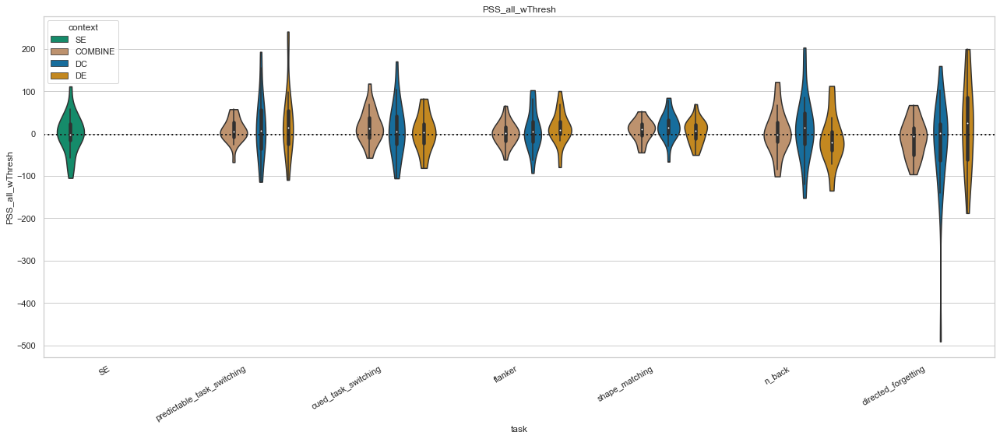

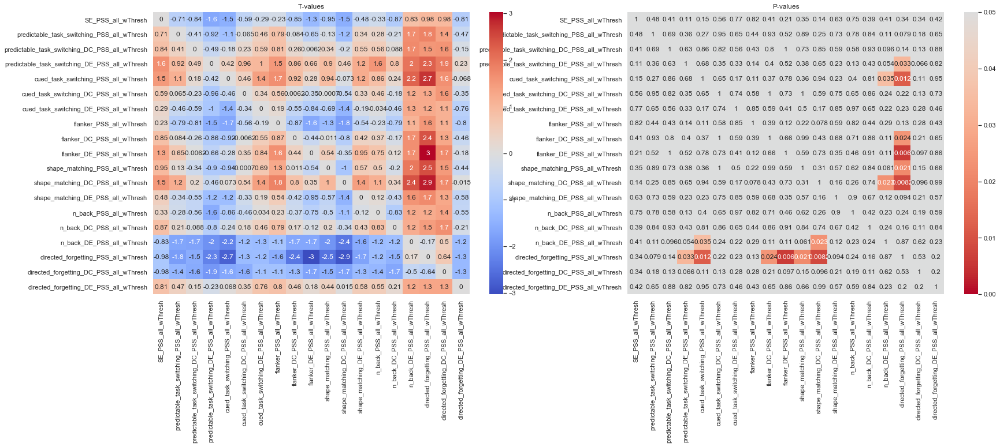

dropping 11


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back>0,n_back_DC>0,n_back_DE>0,flanker>0,flanker_DC>0,flanker_DE>0,shape_matching>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,0.134926,-0.126211,-0.229589,-0.199134,2.241014,0.340351,0.866694,0.109865,-2.392057,-0.199134,-1.604881,2.225872,2.241014,2.599096,1.916515,0.340351,-1.035902,0.207474,0.866694,-0.062904,-0.719731,0.109865,0.858302,-0.897427,-2.392057,-0.465314,-1.885775,2.469354,0.141994,1.236849,-0.725034,-1.206015,-1.162873
p,0.893956,0.900765,0.820633,0.844073,0.035961,0.736974,0.395905,0.913559,0.026187,0.844073,0.123454,0.037106,0.035961,0.016749,0.06901,0.736974,0.31203,0.837638,0.395905,0.950438,0.479625,0.913559,0.400417,0.379665,0.026187,0.646496,0.073235,0.022197,0.888438,0.229797,0.476433,0.241224,0.257926


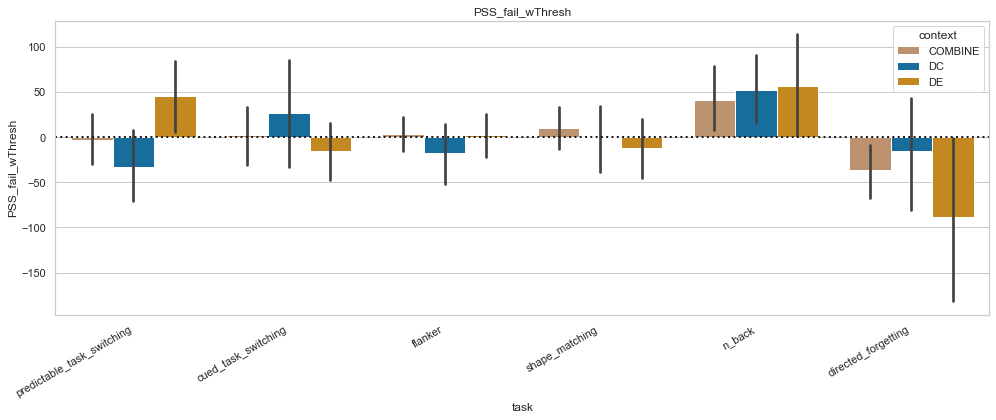

/Users/henrymj/anaconda3/lib/python3.7/site-packages/pingouin/distribution.py:459: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,313202.999852,5,105,62640.599970,7.533533,0.000004,0.000049,0.083774,0.753058
1,context,1609.812508,2,42,804.906254,0.066789,0.935491,0.883516,0.000431,0.732688
2,task * context,164857.286505,10,210,16485.728651,1.841734,0.055194,0.148458,0.044095,0.301010


dropping 11


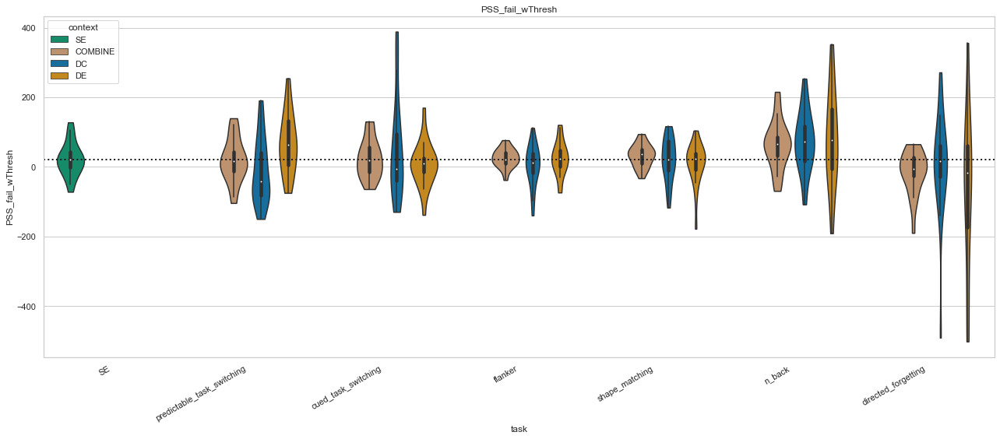

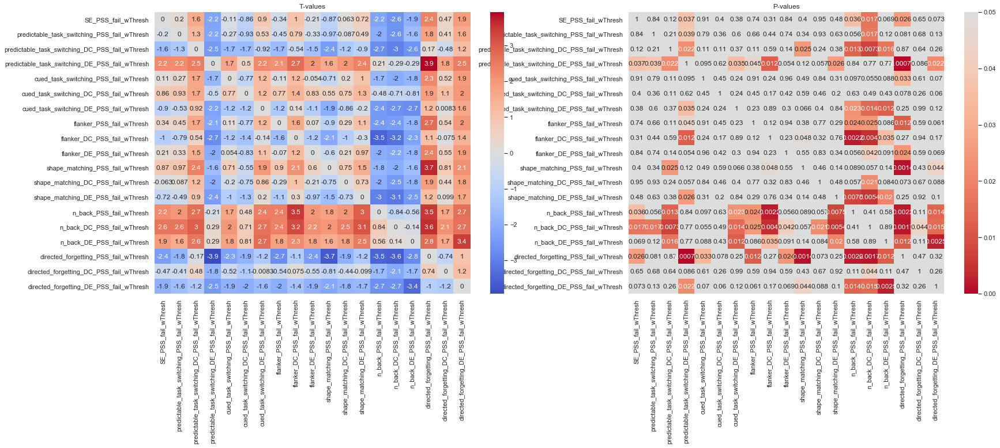

dropping 17


,DC>0,DE>0,DE>DC,predictable_task_switching>0,n_back>0,flanker>0,shape_matching>0,cued_task_switching>0,directed_forgetting>0,predictable_task_switching>0,predictable_task_switching_DC>0,predictable_task_switching_DE>0,n_back>0,n_back_DC>0,n_back_DE>0,flanker>0,flanker_DC>0,flanker_DE>0,shape_matching>0,shape_matching_DC>0,shape_matching_DE>0,cued_task_switching>0,cued_task_switching_DC>0,cued_task_switching_DE>0,directed_forgetting>0,directed_forgetting_DC>0,directed_forgetting_DE>0,predictable_task_switching: DE>DC,n_back: DE>DC,flanker: DE>DC,shape_matching: DE>DC,cued_task_switching: DE>DC,directed_forgetting: DE>DC
t,1.607996,1.801995,0.673403,1.339751,-2.52203,0.95438,0.161744,1.591013,0.335744,1.339751,1.837573,0.690791,-2.52203,-0.579237,-1.809773,0.95438,2.413832,1.568532,0.161744,1.143326,0.2855,1.591013,1.203943,0.100853,0.335744,-0.52426,2.824663,-1.17889,-0.966289,-1.736951,-1.010532,-1.017834,2.639912
p,0.128677,0.091675,0.510934,0.200271,0.023462,0.35502,0.873666,0.132457,0.741714,0.200271,0.086015,0.500248,0.023462,0.571027,0.09041,0.35502,0.029029,0.137608,0.873666,0.270823,0.779166,0.132457,0.247267,0.921003,0.741714,0.607759,0.012806,0.256804,0.349221,0.10288,0.328264,0.324894,0.018562


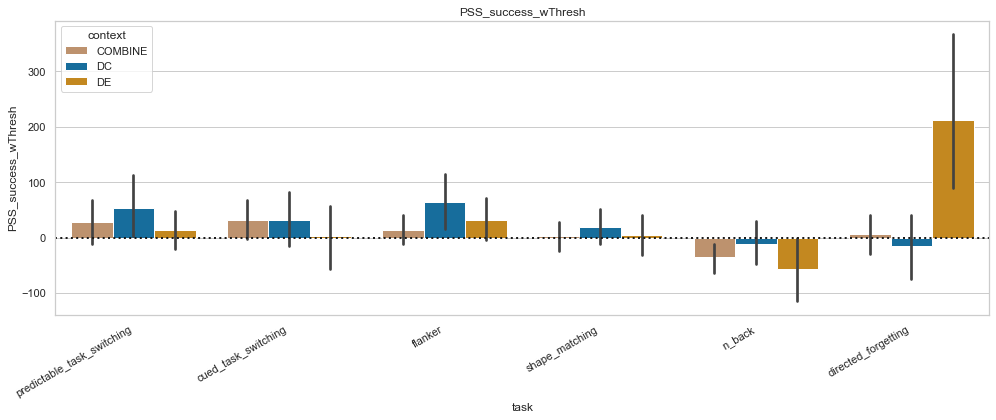

/Users/henrymj/anaconda3/lib/python3.7/site-packages/pingouin/distribution.py:459: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "


,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,n2,eps
0,task,278157.721880,5,75,55631.544376,5.827301,0.000134,0.002243,0.080798,0.573607
1,context,35684.420024,2,30,17842.210012,1.887991,0.168927,0.184001,0.010365,0.673000
2,task * context,530700.074208,10,150,53070.007421,4.979722,0.000003,0.012908,0.154155,0.204518


dropping 17


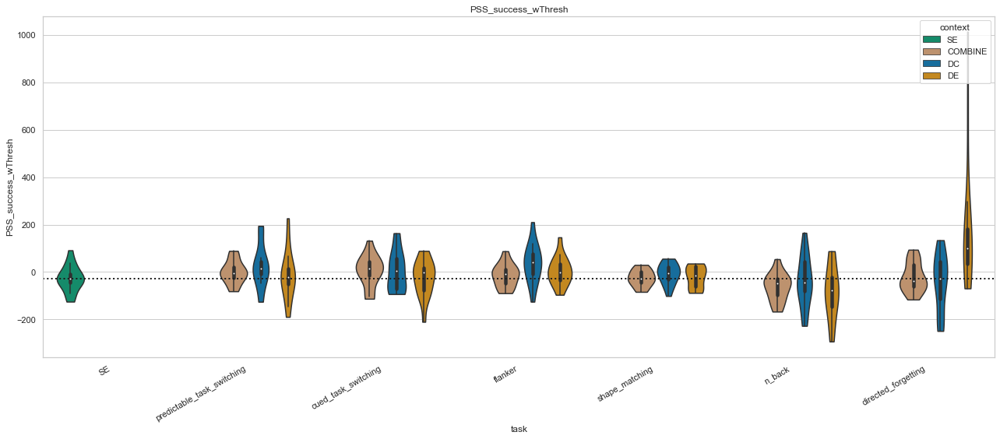

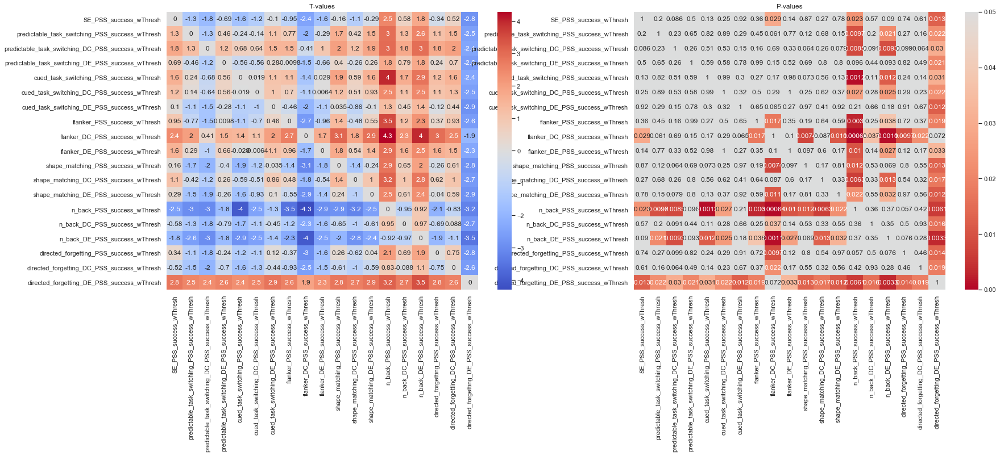

In [17]:
for metric in [m for m in metric_dict if m!='SSRT']:
    diff_plot(metric_dict, metric)
    met_melt = violin_metric(metric_dict, metric)
    p_t_plots(met_melt)

# Directed Forgetting Plots
## To investigate potential drivers in the change in SSRT

dropping 3
dropping 9


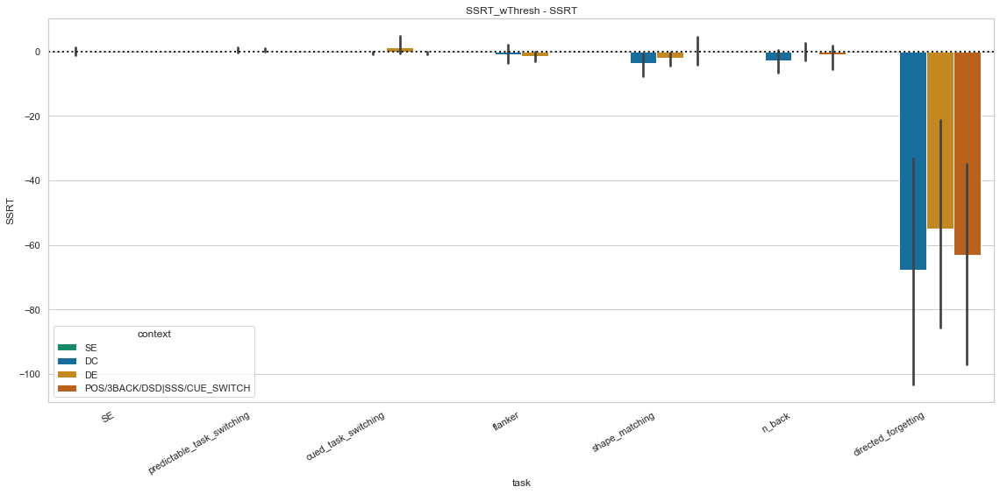

In [18]:
base_df = load_simple_metric_df('SSRT', drop_SE=False, drop_other=False, dropna=True)
thresh_df = load_simple_metric_df('SSRT_wThresh', drop_SE=False, drop_other=False, dropna=True)
diff_df = thresh_df.sub(base_df)

diff_melt = clean_melt_names(diff_df.reset_index().melt(id_vars='ID'), 'SSRT')
diff_melt = sort_melt(diff_melt)

x='task'
y='SSRT'
hue='context'
fig = plt.figure(figsize=(16,8))
ax = sns.barplot(x=x, y=y, hue=hue, data=diff_melt, palette=palette)

_ = plt.xticks(rotation=30, ha='right')
lowx, highx = plt.xlim()
plt.plot([lowx, highx],[0,0],color='k',linestyle=':',linewidth=2)
plt.title('SSRT_wThresh - SSRT')
plt.tight_layout()
lowy, highy = plt.ylim()
_ = plt.axis([lowx, highx, lowy, highy])

In [19]:
dirforg_df = flattened_data.filter(regex='directed_forgetting').copy().rename(columns=lambda x: x.replace('directed_forgetting_', ''))
dirforg_df['mean_SSD'] = dirforg_df[['DC_mean_SSD', 'DE_mean_SSD']].mean(1)
median_SSD = dirforg_df['mean_SSD'].median()

t_test_dict = {
    'SSRT': {},
    'SSD': {}
}
simple_long_df = pd.DataFrame()
for cntxt in ['DC', 'DE']:
    simple_df = pd.DataFrame()
    high_ssds = dirforg_df['mean_SSD'] > median_SSD
    dirforg_df[f'{cntxt}_SSD_highlow'] = high_ssds

    simple_df['SSD_highlow'] = dirforg_df[f'{cntxt}_SSD_highlow'].copy()
    simple_df['SSD'] = dirforg_df[f'{cntxt}_mean_SSD'].copy()
    simple_df['SSRT'] = dirforg_df[f'{cntxt}_SSRT'].copy()
    simple_df['context'] = cntxt
    simple_df = simple_df.reset_index()
    for metric in ['SSRT', 'SSD']:
        t_test_dict[metric][f'{cntxt}_high'] = simple_df.loc[high_ssds.values, metric].copy()
        t_test_dict[metric][f'{cntxt}_low'] = simple_df.loc[~np.array(high_ssds.values), metric].copy()
    simple_long_df = pd.concat([simple_long_df, simple_df],0)

simple_long_df['SSD_highlow'] = np.where(simple_long_df['SSD_highlow'], 'high', 'low')

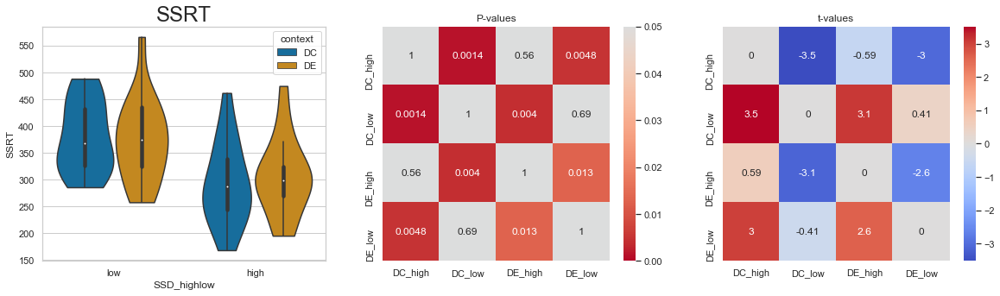

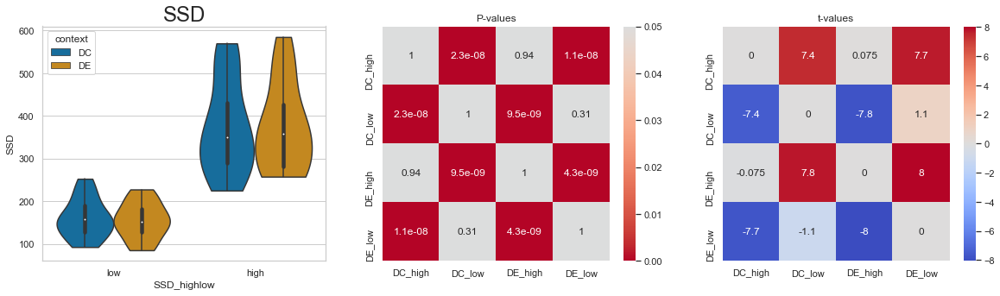

In [20]:
for metric in ['SSRT', 'SSD']:
    x='SSD_highlow'
    y=metric
    hue='context'
    
    test_dict = t_test_dict[metric]
    variables = test_dict.keys()
    p_df = pd.DataFrame(columns=variables, index=variables)
    t_df = pd.DataFrame(columns=variables, index=variables)

    for var1 in variables:
        var1_values = test_dict[var1].values
        for var2 in [v for v in variables if v!=var1]:
            var2_values = test_dict[var2].values
            t,p = stats.ttest_rel(var1_values, var2_values, nan_policy='omit') if var1.split('_')[-1]==var2.split('_')[-1] else stats.ttest_ind(var1_values, var2_values, nan_policy='omit')
            if type(p)!=np.float64:
                p=None
                t=None
            t_df.loc[var1,var2] = t
            p_df.loc[var1,var2] = p

    fig, axes = plt.subplots(1,3, figsize=(20, 5))
    ax = sns.violinplot(x=x, y=y, hue=hue, data=simple_long_df, cut=0, palette=palette, ax=axes[0])
    ax.set_title(metric, fontsize=24)
    
    ax = sns.heatmap(p_df.fillna(1), annot=True, cmap='coolwarm_r', vmin=0, center=.05, vmax=.05, ax=axes[1])
    ax.set_title('P-values')

    ax = sns.heatmap(t_df.fillna(0), annot=True, cmap='coolwarm', center=0, ax=axes[2])
    ax.set_title('t-values')
    plt.show()
    plt.close()

# Simple Task Effects

In [21]:
effect_map = {
    'flanker': {
        'col': 'flanker_condition',
        'base': 'congruent',
        'hard': ['incongruent']
    },
    'cued_task_switching': {
        'col': 'cue_task_switch',
        'base': 'cue_stay_task_stay',
        'hard': ['cue_switch_task_stay', 'cue_switch_task_switch']
    },
    'predictable_task_switching': {
        'col': 'predictable_condition',
        'base': 'stay',
        'hard': ['switch']
    },
    'directed_forgetting': {
        'col': 'directed_forgetting_condition',
        'base': 'con',
        'hard': ['neg', 'pos']
    },
    'shape_matching': {
        'col': 'shape_matching_condition',
        'base': 'CONTROL',
        'hard': ['DISTRACTOR']
    },
    'n_back': {
        'col': 'delay_condition',
        'base': 1,
        'hard': [2, 3]
    },
}

cost_map = {
    'cued_task_switching': ['cue_switch_task_stay-cue_stay_task_stay_', 'cue_switch_task_switch-cue_stay_task_stay_', 'task_switch-cue_switch_'],
    'directed_forgetting': ['neg-con_', 'pos-con_'],
    'n_back': ['2-1_', '3-1_']
}

def get_task_effects(subj_df, task):
    task_map = effect_map[task]
    subj_df = subj_df.copy().reset_index()
    #subset to go response trials
    go_resp_idx = (subj_df['stop_signal_condition']=='go') &(subj_df['rt'] > 0)
    subj_df = subj_df[go_resp_idx].copy()
    result_dict = {}
    for metric in ['rt', 'choice_accuracy']:
        if metric=='rt': #if RT, subset to correct trials
            curr_df = subj_df[subj_df['choice_accuracy']==1] 
        else:
            curr_df = subj_df
        base_val = curr_df.loc[curr_df[task_map['col']]==task_map['base'], metric].mean()
        for hard_col in task_map['hard']:
            hard_val = curr_df.loc[curr_df[task_map['col']]==hard_col, metric].mean()
            result_dict['%s-%s_%s' % (hard_col, task_map['base'], metric)] = hard_val - base_val
        if task=='cued_task_switching': # get residual switch cost
            result_dict['task_switch-cue_switch_%s' % metric] = curr_df.loc[curr_df[task_map['col']]=='cue_switch_task_switch', metric].mean() -\
                                                                curr_df.loc[curr_df[task_map['col']]=='cue_switch_task_stay', metric].mean()
    return result_dict

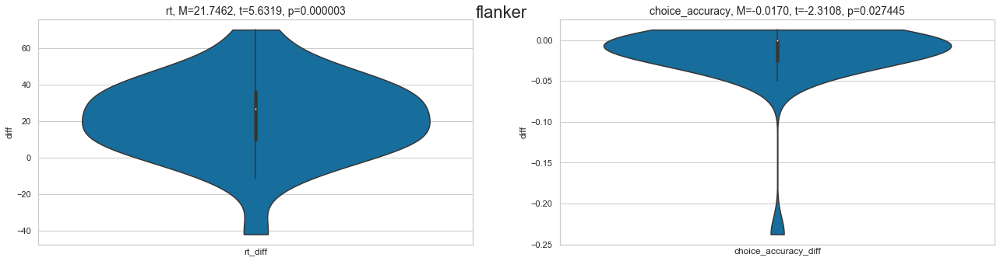

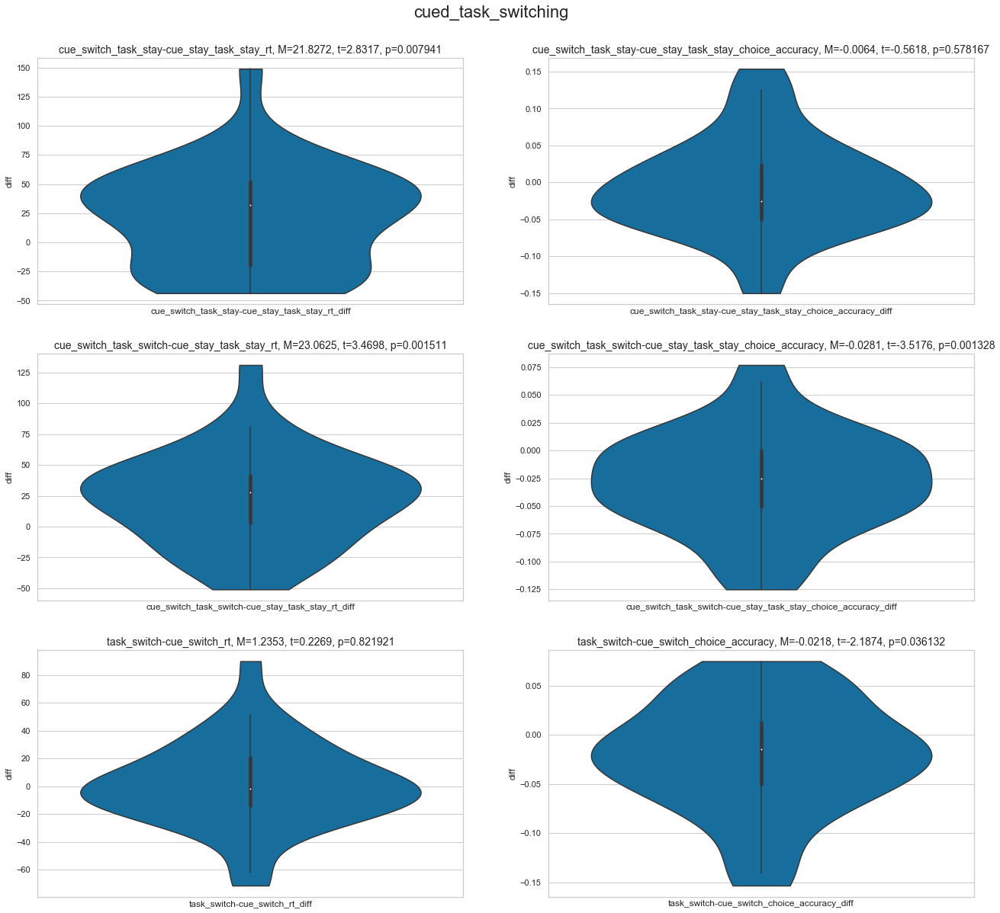

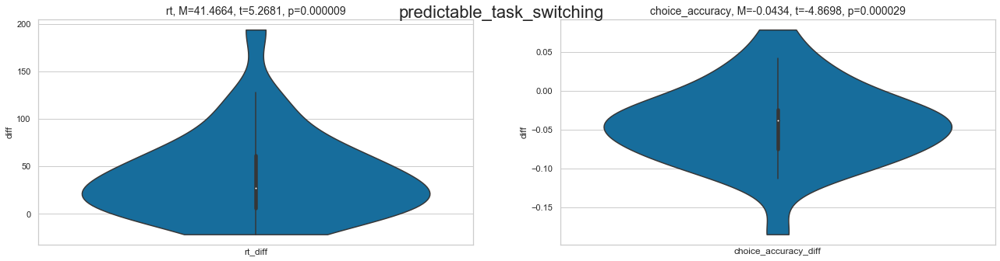

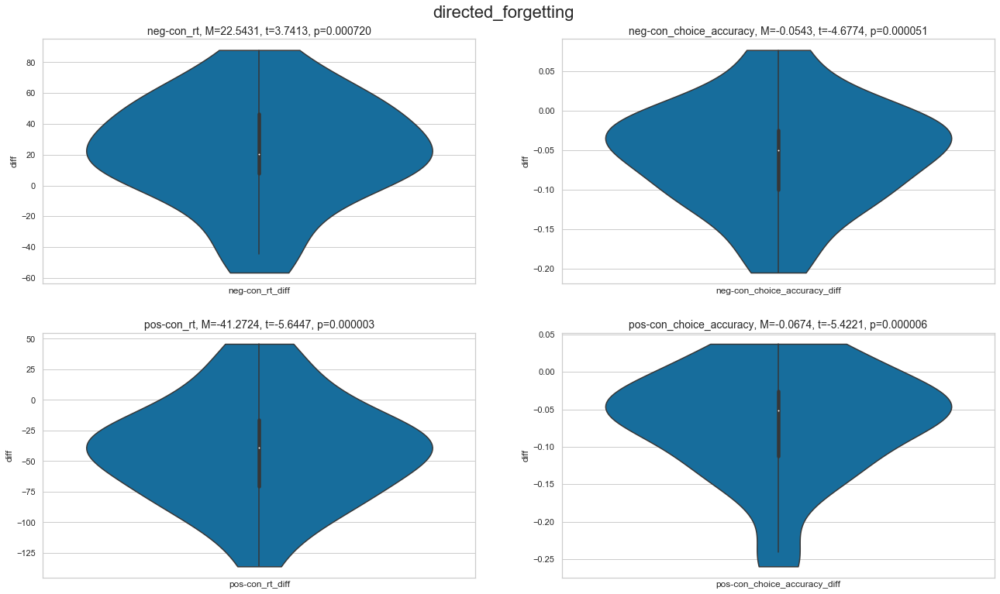

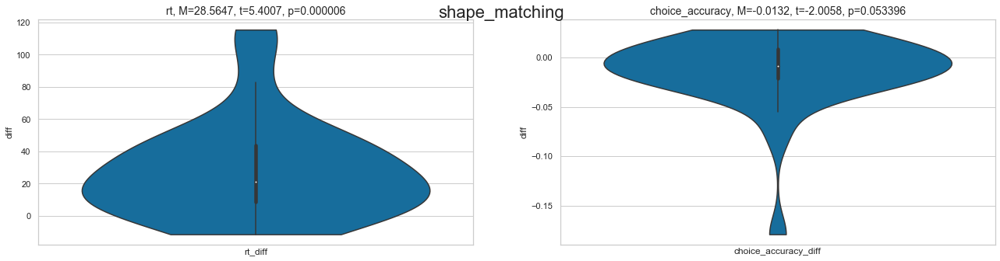

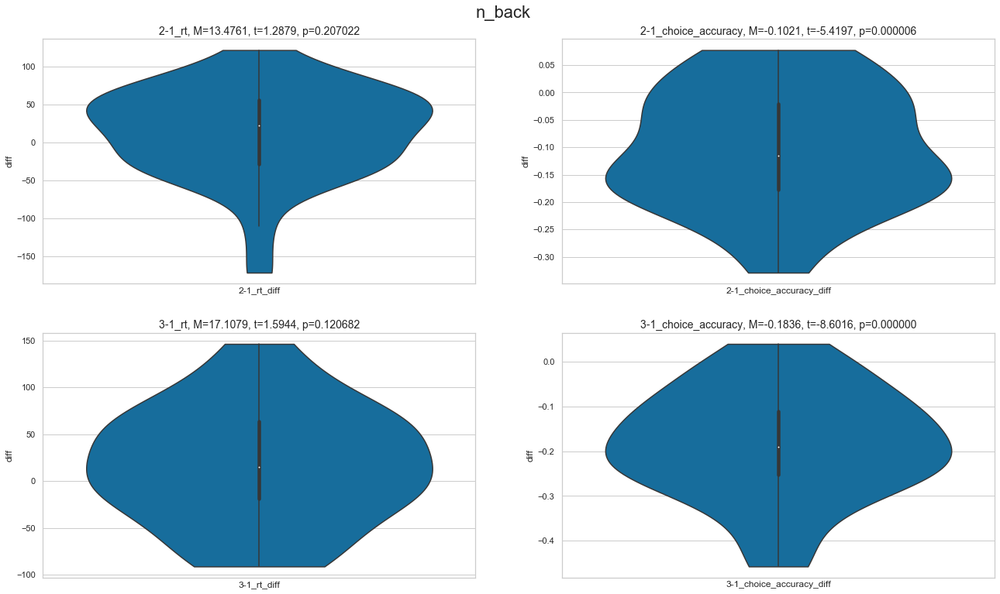

In [23]:
for task in effect_map.keys():
    task_df = stop_data_dict['stop_signal_with_%s' % task].copy()
    effect_df = task_df.groupby('worker_id').apply(get_task_effects, task).apply(pd.Series)
    
    costs = cost_map[task] if task in cost_map.keys() else ['']
        
    fig, axes = plt.subplots(len(costs),2, figsize=(22,5*len(costs) + 2*(len(costs)-1)))
    for idx, cost in enumerate(costs):
        for jdx, metric in enumerate(['rt', 'choice_accuracy']):
            values = effect_df.filter(regex=f'{cost}{metric}')
            assert values.shape[1]==1 # only 1 column
            values = values[values.columns[0]]
            t,p = stats.ttest_1samp(values.values, 0)
            ax = axes[idx, jdx] if len(costs)>1 else axes[jdx]
            ax = sns.violinplot(data=values, ax=ax,cut=0)
            ax.set_ylabel('diff')
            ax.set_xticks([])
            ax.set_xlabel(f'{cost}{metric}_diff')
            ax.set_title(f'{cost}{metric}, M={values.mean():.4f}, t={t:.4f}, p={p:.6f}', fontsize=14)
    plt.suptitle(task, fontsize=22)
    fig.subplots_adjust(top=0.93)
    plt.show()
    plt.close()

# Heatmaps

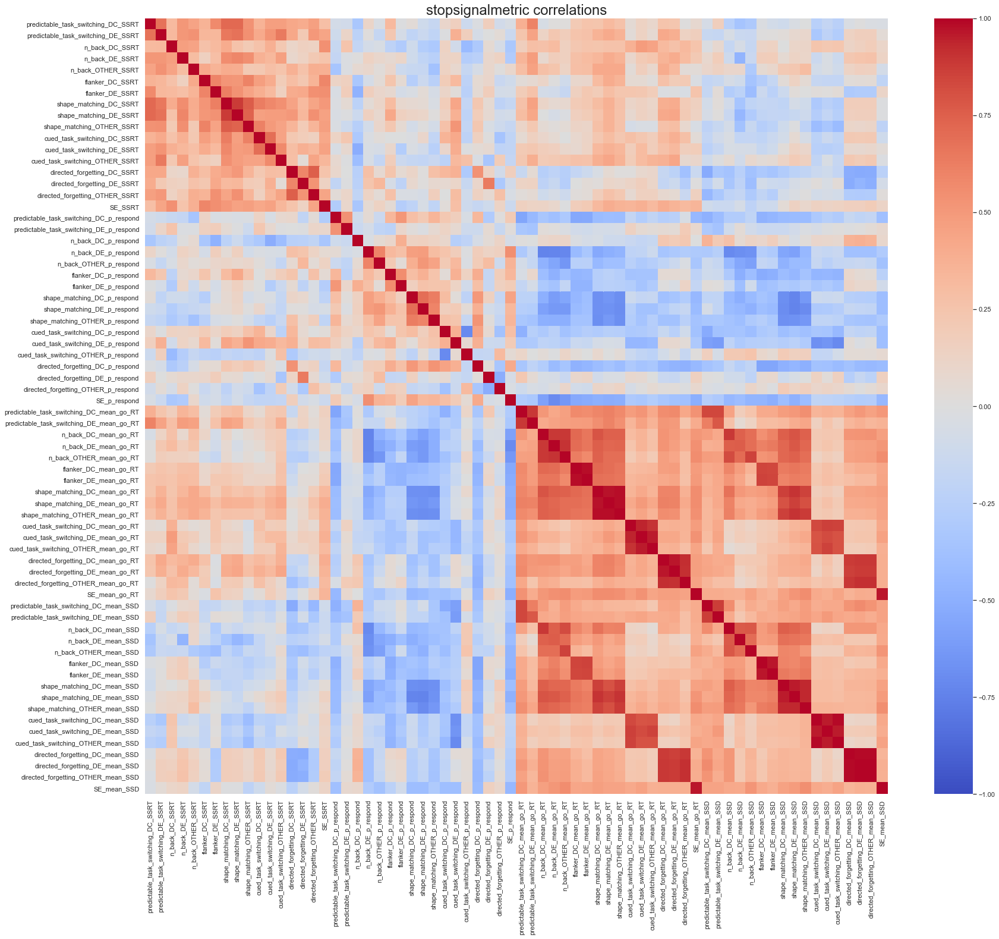

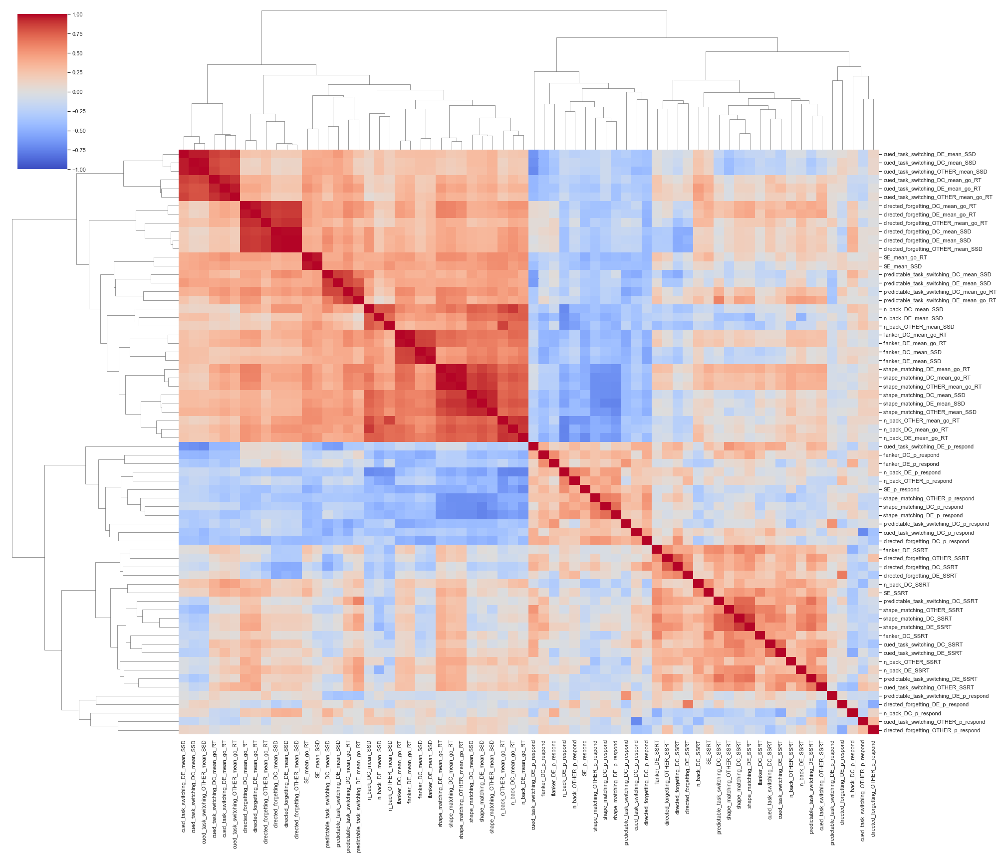

In [24]:
SSRT_component_df = pd.DataFrame()
for metric in [f'SSRT', 'p_respond', 'mean_go_RT', 'mean_SSD']:
    SSRT_component_df = pd.concat([SSRT_component_df, metric_dict[metric]],1)

plt.figure(figsize=(28,24))
sns.heatmap(SSRT_component_df.corr(), cmap='coolwarm', center=0, vmax=1, vmin=-1)
plt.title('stopsignalmetric correlations', fontsize=24)
plt.show()
plt.close()
sns.clustermap(SSRT_component_df.corr(), cmap='coolwarm', center=0, vmax=1, vmin=-1, figsize=(28,24))
plt.show()
plt.close()

# Supplement
## repeating the t-tests and bar/violinplots while including the 3rd conditions

In [25]:
RUN_SUPPLEMENT = False
if RUN_SUPPLEMENT:
    drop_other = False
    for metric in metric_dict:
        diff_plot(metric_dict, metric, drop_other=drop_other)
        met_melt = violin_metric(metric_dict, metric, drop_other=drop_other)
        p_t_plots(met_melt)